In [1]:
%matplotlib notebook
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import numpy.ma as ma
import glob
from collections import namedtuple, OrderedDict
import netCDF4 as nc
import os
import scipy
import scipy.io as sio
from scipy import interpolate, signal
from pyproj import Proj,transform
import sys
sys.path.append('/ocean/ssahu/CANYONS/wcvi/grid/')
from bathy_common import *
from matplotlib import path
from salishsea_tools import viz_tools
import xarray as xr
from salishsea_tools import nc_tools
import scipy.io as sio
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm
import cmocean as cmo
import matplotlib.gridspec as gridspec
%matplotlib inline
from scipy.io import loadmat
from scipy.interpolate import griddata
from dateutil.parser import parse
from salishsea_tools import geo_tools, viz_tools, tidetools, nc_tools
import gsw

import seaborn as sns
from windrose import plot_windrose
from windrose import WindroseAxes


from dateutil        import parser
from datetime import datetime

sns.set_context('poster')
sns.set_style('dark')

/home/ssahu/anaconda3/lib/python3.5/site-packages/xarray/conventions.py:9: FutureWarning: The pandas.tslib module is deprecated and will be removed in a future version.
  from pandas.tslib import OutOfBoundsDatetime


In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [3]:
zlevels = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/CDF_COMB_COMPRESSED/NEP036-N30_IN_20140915_00001440_grid_T.nc').variables['deptht'][:32]
y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))

In [35]:

# nc_file = nc.Dataset('/data/ssahu/ARIANE/A_1_tracks/traj_tracers.nc')
# nc_file = nc.Dataset('/data/ssahu/ARIANE/Survey_A_pt_1/traj_tracers.nc')

# nc_file = nc.Dataset('/data/ssahu/ARIANE/Survey_A_pt_1/traj_26_AUG.nc')


nc_file = nc.Dataset('/data/ssahu/ARIANE/LB_08/ariane_trajectories_qualitative.nc')
nc_tools.show_variables(nc_file)

odict_keys(['init_x', 'init_y', 'init_z', 'init_t', 'init_age', 'init_transp', 'final_x', 'final_y', 'final_z', 'final_t', 'final_age', 'final_transp', 'traj_lon', 'traj_lat', 'traj_depth', 'traj_time', 'traj_temp', 'traj_salt', 'traj_dens'])


In [36]:
# init_x = ariane_output_A1.variables['init_x']
# init_z = ariane_output_A1.variables['init_z']
# init_age = ariane_output_A1.variables['init_age']

# traj_depth = ariane_output_A1.variables['traj_depth'][:]
# traj_lon   = ariane_output_A1.variables['traj_lon'][:]
# traj_lat   = ariane_output_A1.variables['traj_lat'][:]


# final_age = ariane_output_A1.variables['final_age']


In [37]:


init_x = nc_file.variables['init_x']
init_z = nc_file.variables['init_z']
init_age = nc_file.variables['init_age']

traj_depth = nc_file.variables['traj_depth'][:]
traj_lon   = nc_file.variables['traj_lon'][:]
traj_lat   = nc_file.variables['traj_lat'][:]
traj_rho   = nc_file.variables['traj_dens'][:]
traj_tem   = nc_file.variables['traj_temp'][:]
traj_sal   = nc_file.variables['traj_salt'][:]
traj_time  = nc_file.variables['traj_time'][:]


final_age = nc_file.variables['final_age']

In [38]:
lon1=nc_file.variables['traj_lon']
lat1=nc_file.variables['traj_lat']
dep1=nc_file.variables['traj_depth']
x1=nc_file.variables['init_x']
y1=nc_file.variables['init_y']
t1=nc_file.variables['traj_time']

x2=nc_file.variables['final_x']
y2=nc_file.variables['final_y']




In [39]:
final_age[-1]/(3600*24)

91.557827959934002

In [40]:
traj_depth[0].shape

(13,)

In [41]:
y1[:]

array([ 85.01,  85.01,  85.01,  85.01,  85.01,  85.01,  85.01,  85.01,
        85.01,  85.01,  85.01,  85.01,  85.01])

In [42]:
y2[:]

array([ 84.90547629,  85.19358055,  85.34943209,   1.        ,
         1.        ,   1.        ,   1.        ,   1.        ,
         1.        ,   1.        ,   1.        ,   1.        ,   1.        ])

In [43]:
traj_depth[0,]

masked_array(data = [-1.0112751722335815 -5.745136737823486 -8.729995727539062
 -12.404372215270996 -17.105642318725586 -23.334993362426758
 -37.26248550415039 -51.381935119628906 -60.558807373046875
 -71.55553436279297 -84.75727844238281 -100.62609100341797
 -119.71409606933594],
             mask = [False False False False False False False False False False False False
 False],
       fill_value = 1e+20)

In [13]:
traj_rho[:,9]

masked_array(data = [26.291330337524414 26.285688400268555 26.279382705688477 ..., -- -- --],
             mask = [False False False ...,  True  True  True],
       fill_value = 1e+20)

In [47]:
np.ma.array(np.multiply(-1,traj_depth[10,traj_depth_level])).filled()

array(100.44910908209265)

In [48]:
def plot_tracks(traj_depth_level):  
    
    
    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

    Z = bathy.variables['Bathymetry']


    lon = bathy['nav_lon'][...]
    lat = bathy['nav_lat'][...]
    

        
    lon_A1 = -126.20433
    lat_A1 = 48.52958

    y, x = geo_tools.find_closest_model_point(lon_A1,lat_A1,\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})  
    
    


#     cmap = plt.get_cmap('plasma')
#     cmap = plt.get_cmap(cmo.cm.deep)
    cmap=plt.cm.get_cmap('viridis', 6)
    cmap.set_bad('#8b7765')
    cmin = 0
    cmax = 300
    
    import matplotlib as mpl
#     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

    fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
    CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
    CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)
    
#     q = ax.scatter(x, y, s=500, marker = '*', alpha=0.7, edgecolor= 'cyan', label = 'Station A1' )
    
#     track1 = ax.scatter(x_wcvi_slice[np.int(np.rint(y1[traj_depth_level]))-1], y_wcvi_slice[np.int(np.rint(x1[traj_depth_level]))-1], s=500, marker = '*', alpha=0.7, edgecolor= 'cyan', label = 'Final position' )
#     track2 = ax.scatter(x_wcvi_slice[np.int(np.rint(y2[traj_depth_level]))-1], y_wcvi_slice[np.int(np.rint(x2[traj_depth_level]))-1], s=500, marker = '*', alpha=0.7, edgecolor= 'red', label = 'Initial position' )

    for k in np.arange(traj_lon[:,traj_depth_level].shape[0]):
            y, x = geo_tools.find_closest_model_point(traj_lon[k,traj_depth_level],traj_lat[k,traj_depth_level],\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
            track1 = ax.scatter(x_wcvi_slice[np.int(np.rint(x1[traj_depth_level]))-1], y_wcvi_slice[np.int(np.rint(y1[traj_depth_level]))-1], s=500, marker = '*', c = 'red', alpha=0.9, edgecolor= 'orangered')
            q = ax.scatter(x, y, c = np.ma.array(np.multiply(-1,traj_depth[k,traj_depth_level])).filled(), cmap = cmap, vmin = cmin, vmax= cmax, s=50, alpha=0.5)#, edgecolor= 'cyan')
        


    
#     cbar = fig.colorbar(q, ax=ax)
#     cbar.set_label(label='Spiciness', fontsize = 16)
#     cbar.ax.tick_params(labelsize=16) 

    
    ax.set_xlabel('x index', fontsize =16)
    ax.set_ylabel('y index', fontsize = 16)
    ax.tick_params(axis='both',labelsize =16)
    
    
    ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,traj_depth_level])), fontsize =16)
    ax.legend(loc = 'best')
    
    viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
#     ax.set_ylim(220,280)
#     ax.set_xlim(575,630)
    ax.grid()
    
    cbar = fig.colorbar(q, ax=ax)
    cbar.set_label(label='Depth ($m$)', fontsize = 16)
    cbar.ax.tick_params(labelsize=16)
    fig.tight_layout()



In [16]:
sns.set_context('paper')

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


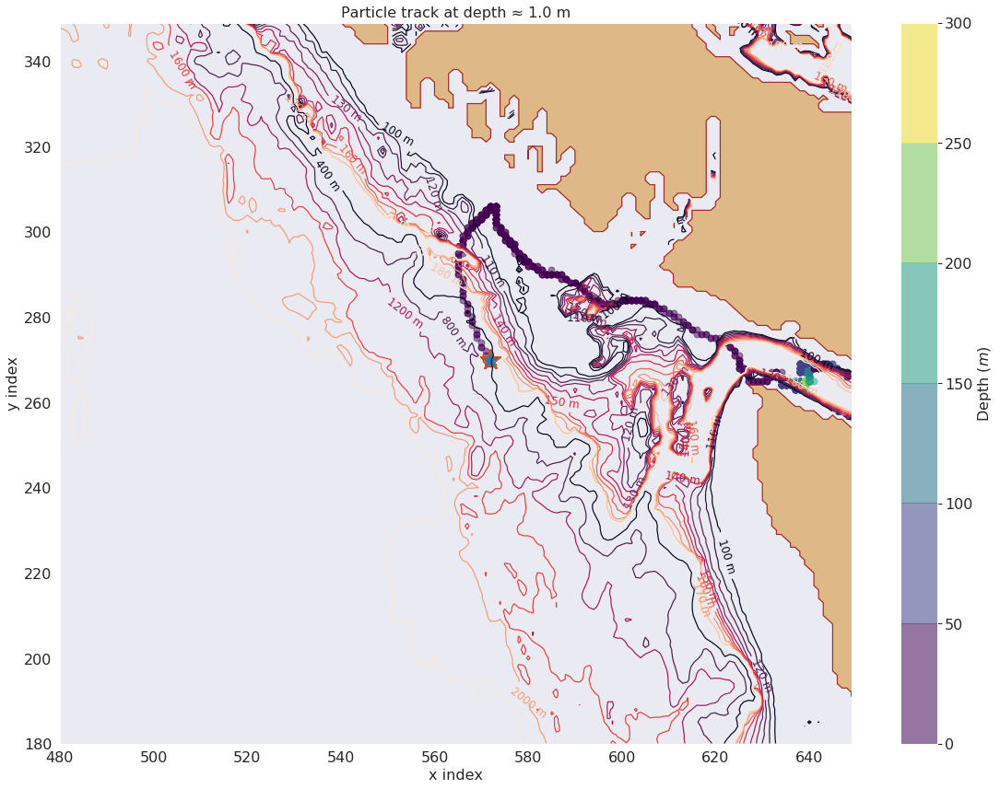

In [71]:
plot_tracks(traj_depth_level=0)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


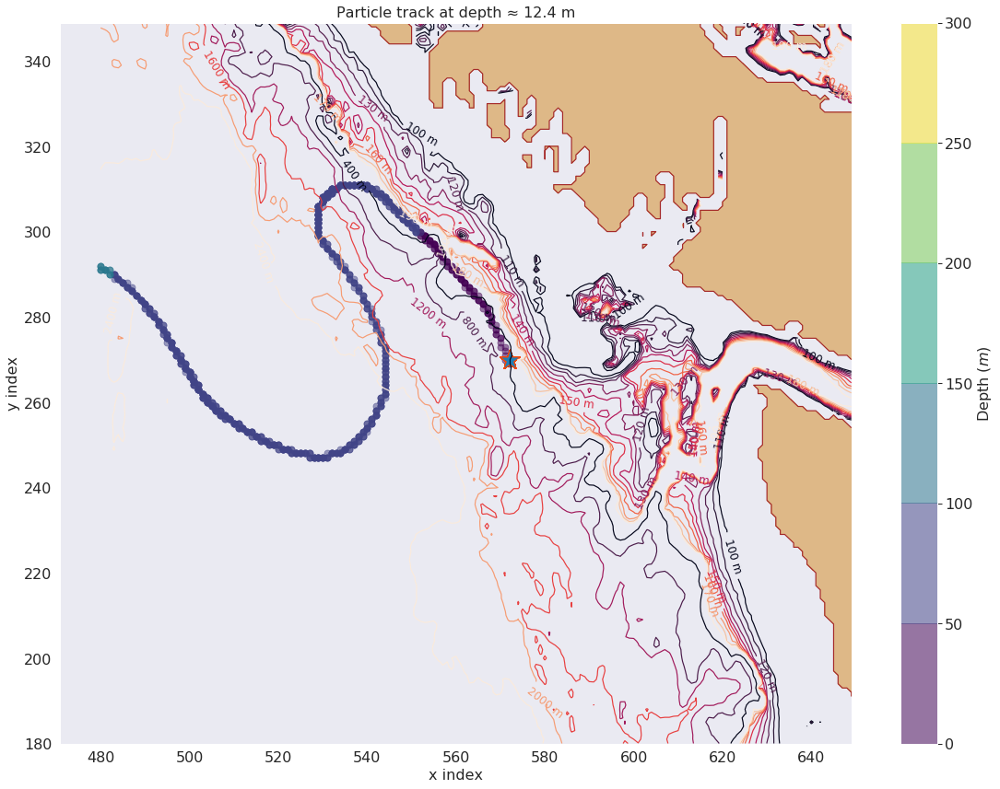

In [72]:
plot_tracks(traj_depth_level=1)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


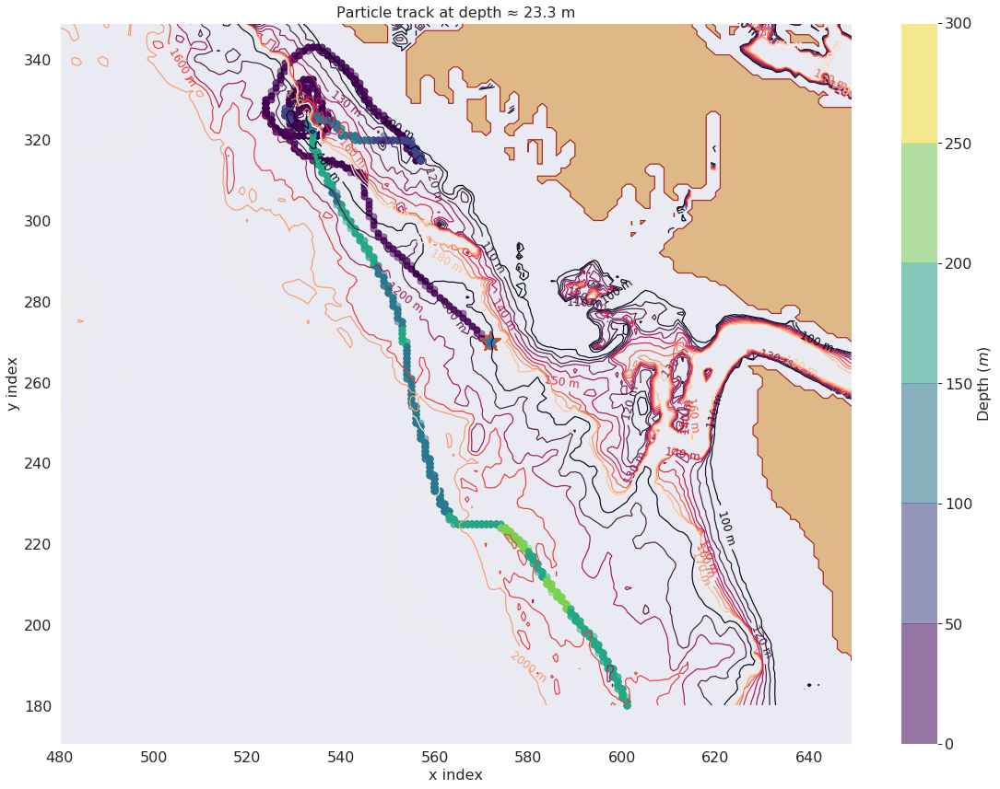

In [73]:
plot_tracks(traj_depth_level=2)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


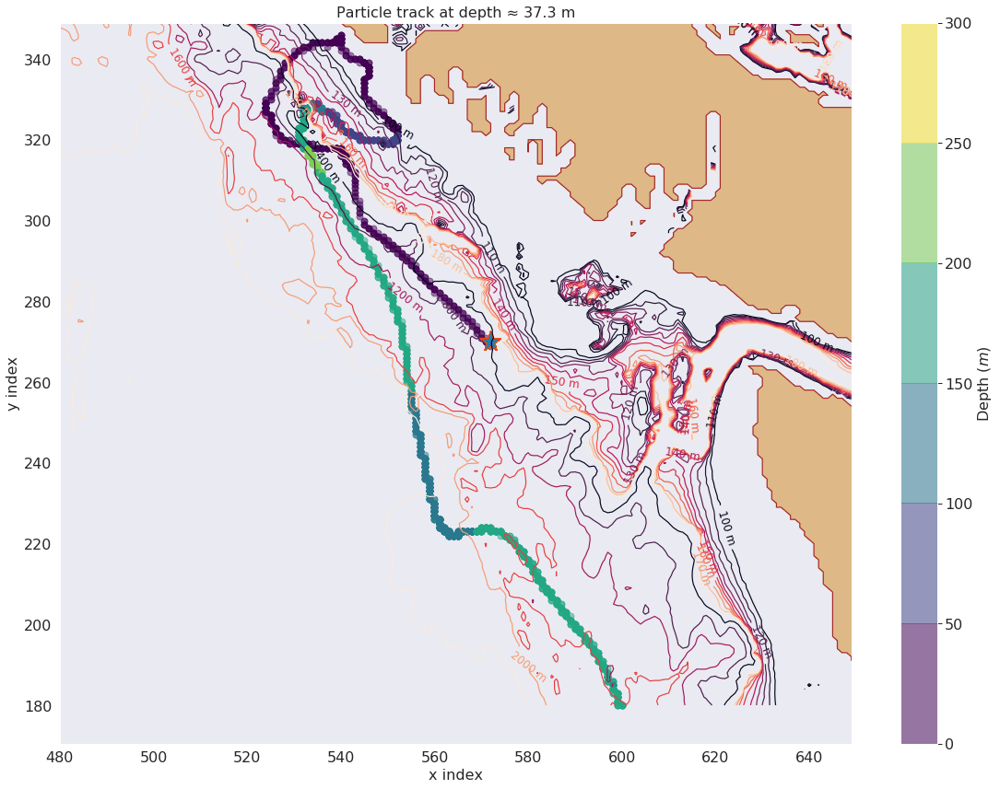

In [74]:
plot_tracks(traj_depth_level=3)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


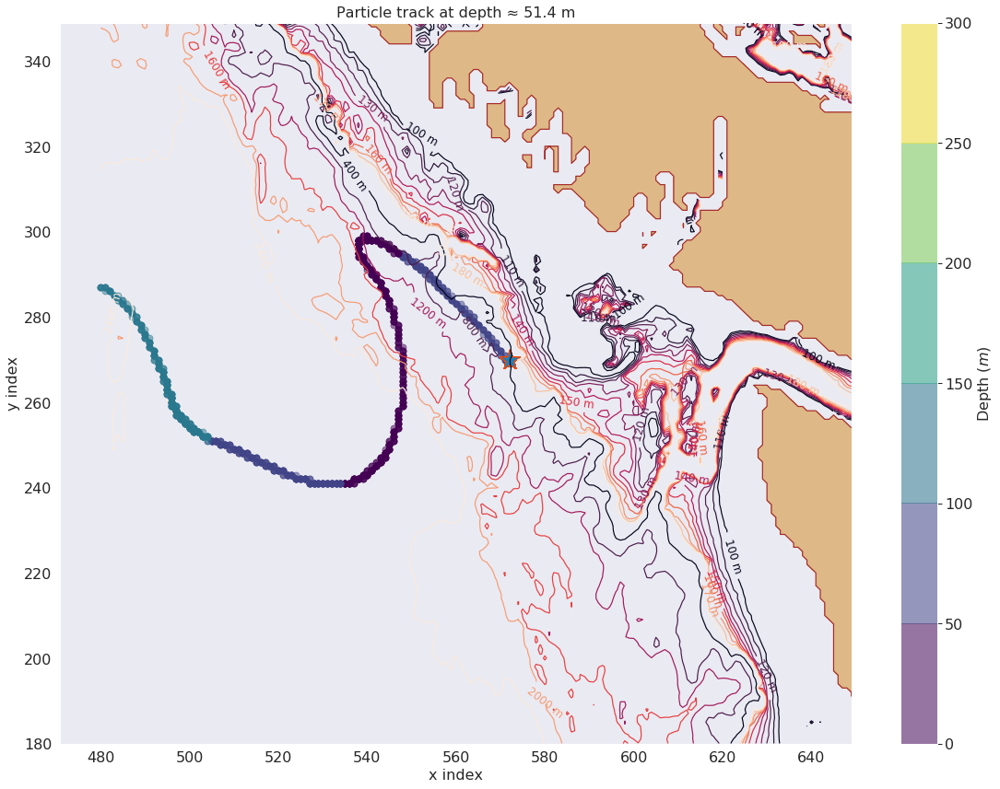

In [75]:
plot_tracks(traj_depth_level=4)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


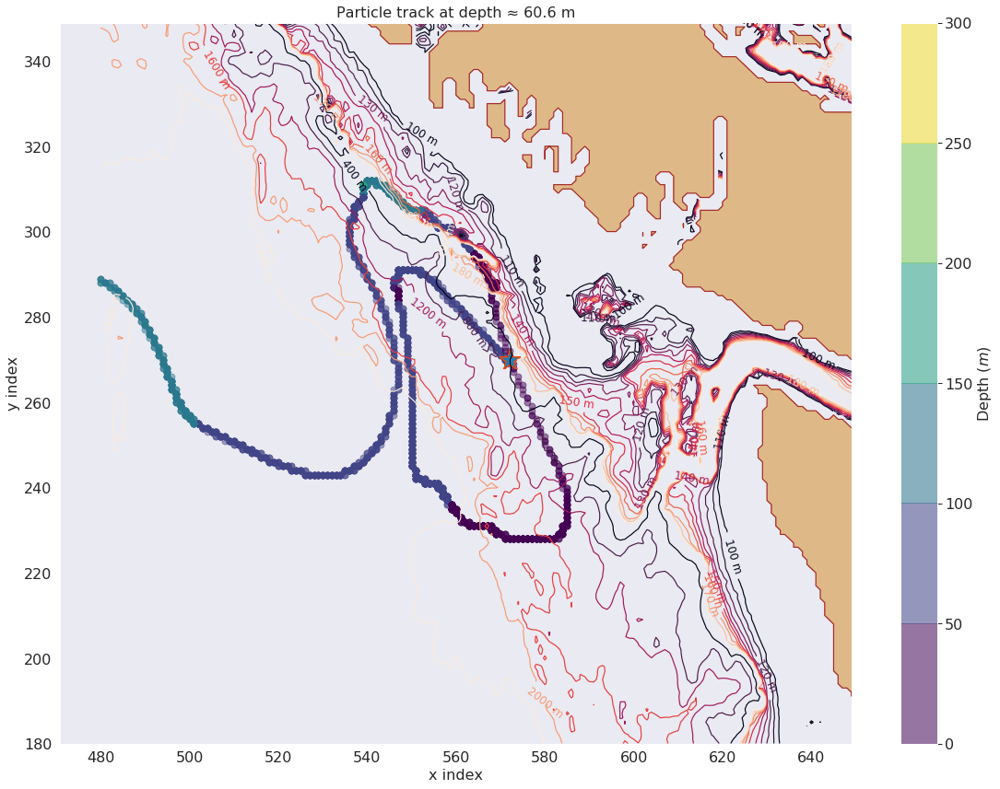

In [76]:
plot_tracks(traj_depth_level=5)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


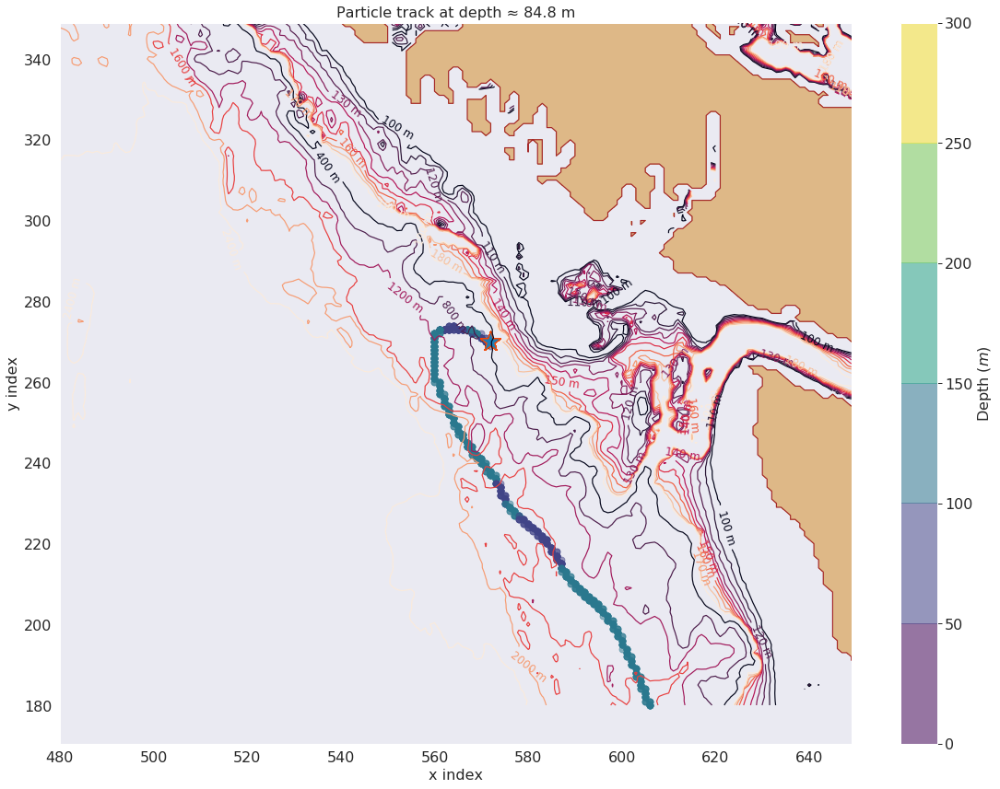

In [77]:
plot_tracks(traj_depth_level=7)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


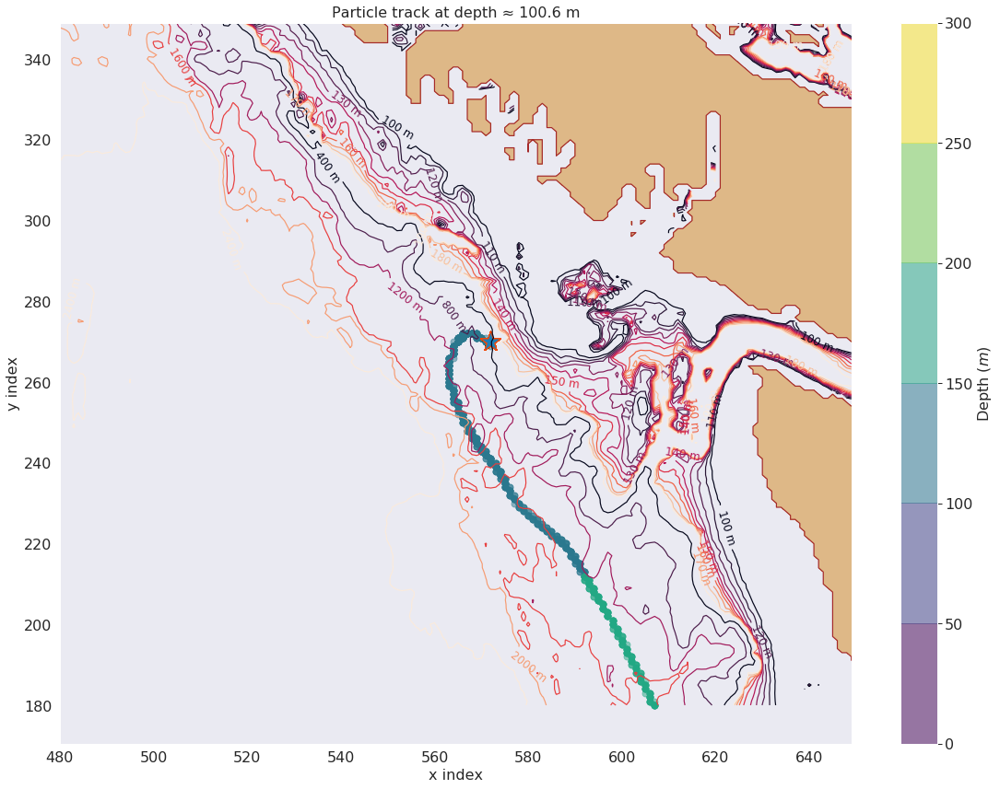

In [78]:
plot_tracks(traj_depth_level=8)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


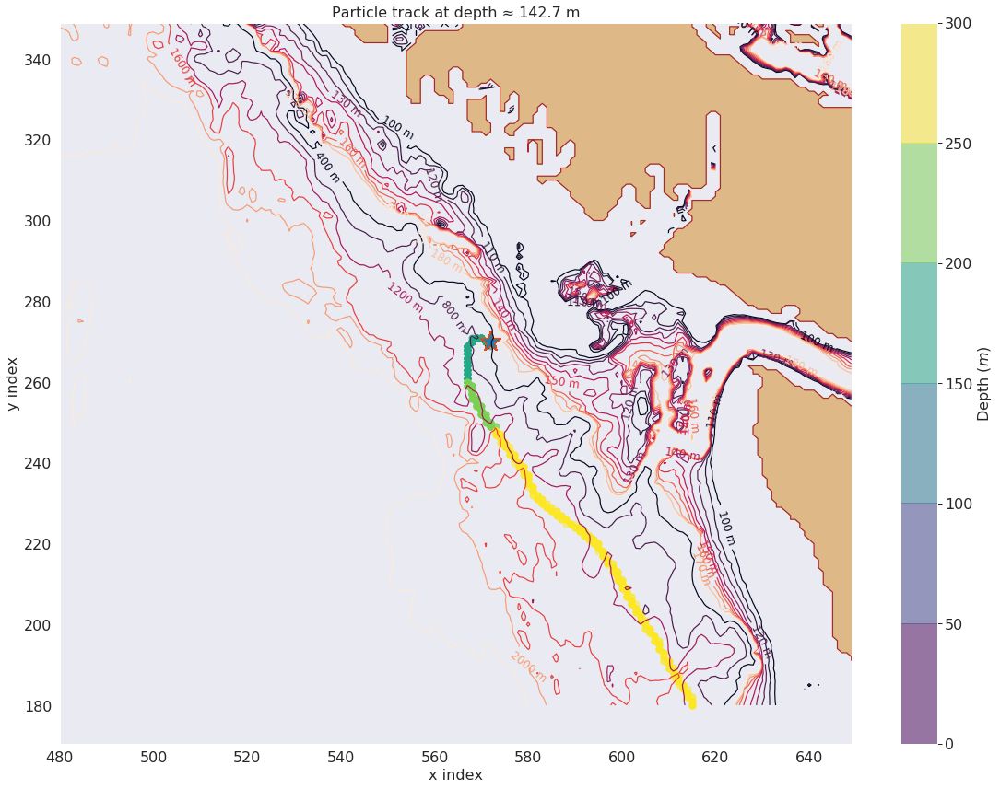

In [79]:
plot_tracks(traj_depth_level=10)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


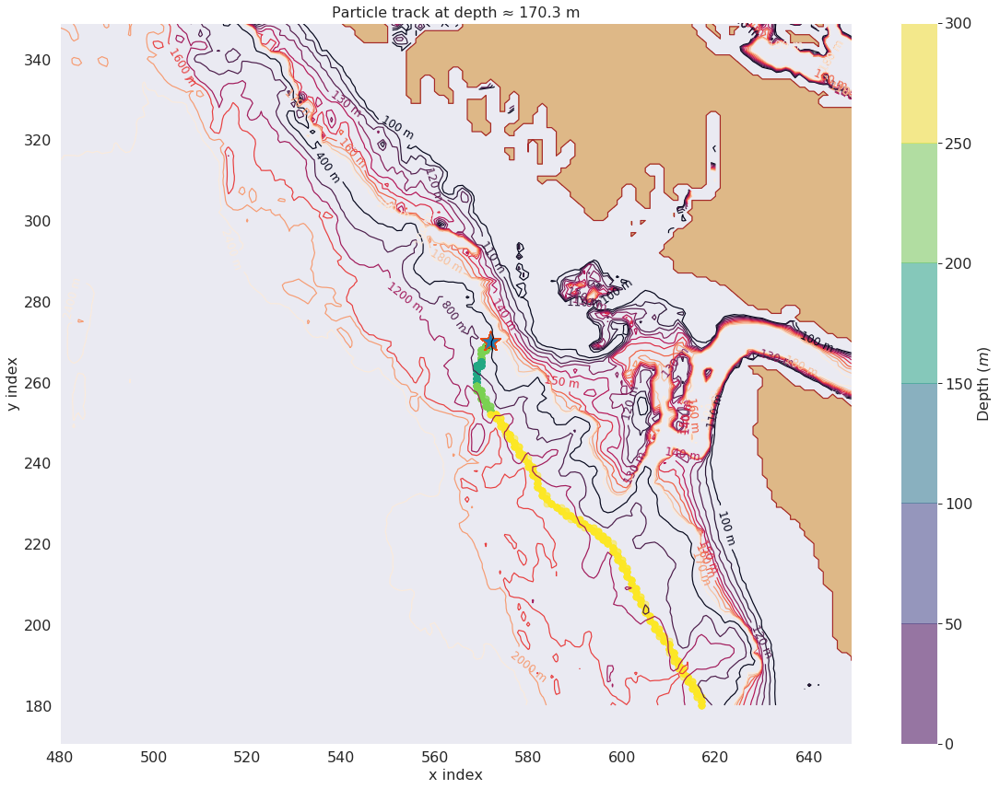

In [82]:
plot_tracks(traj_depth_level=11)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


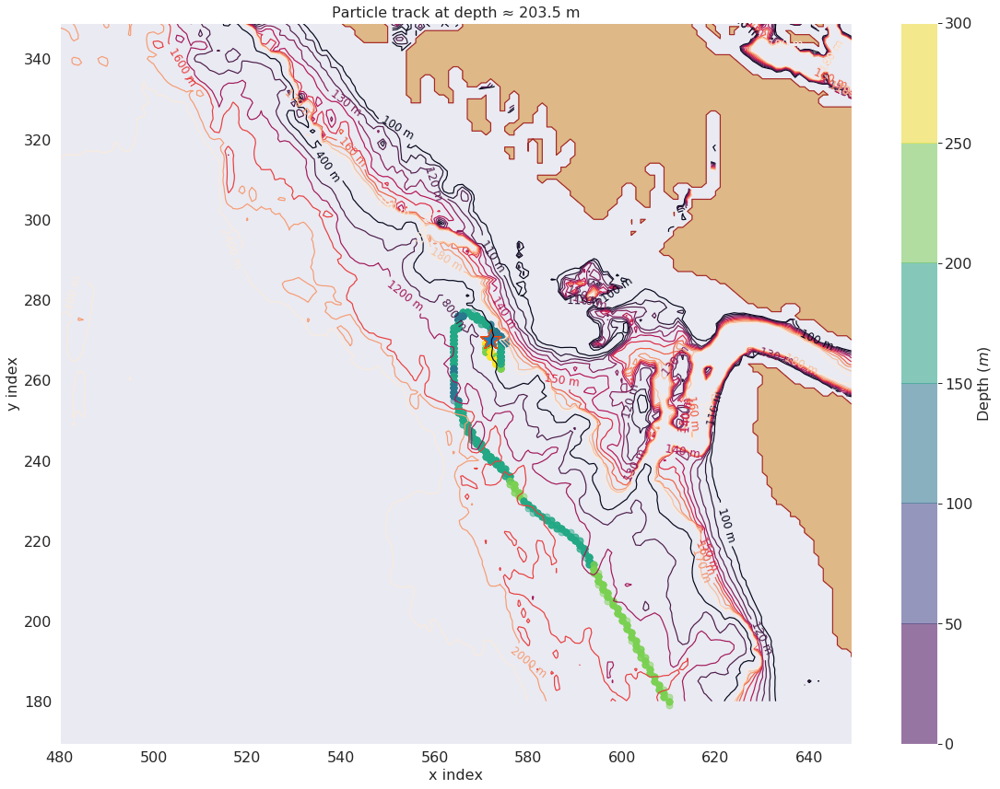

In [80]:
plot_tracks(traj_depth_level=12)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


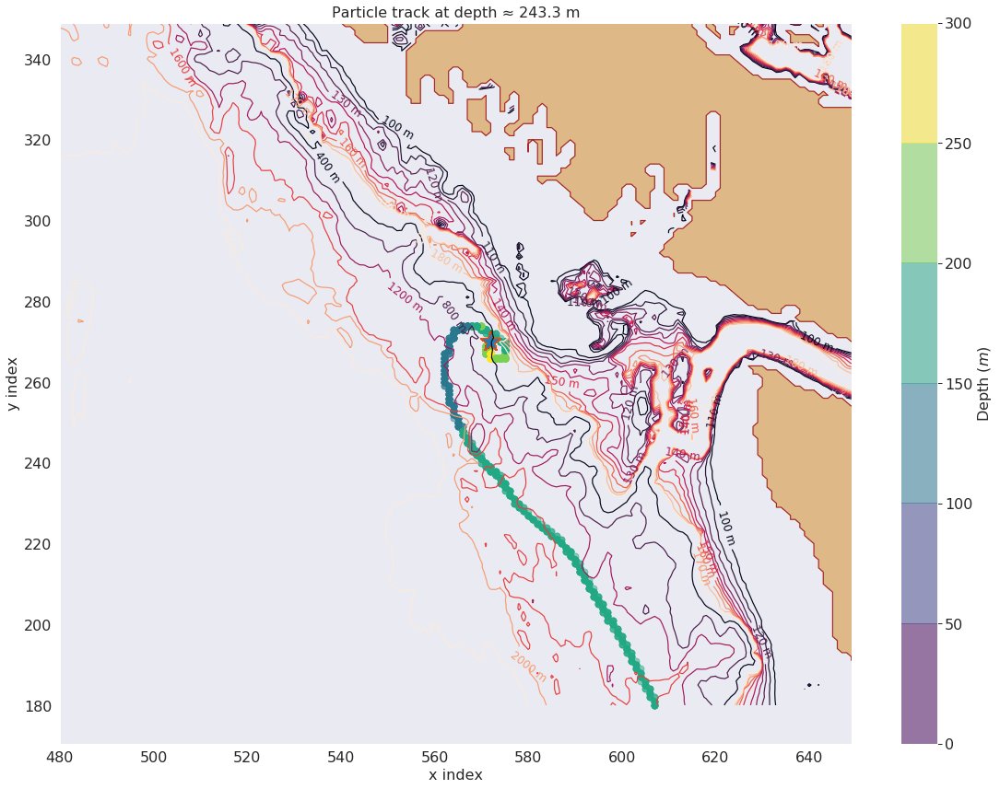

In [83]:
plot_tracks(traj_depth_level=13)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


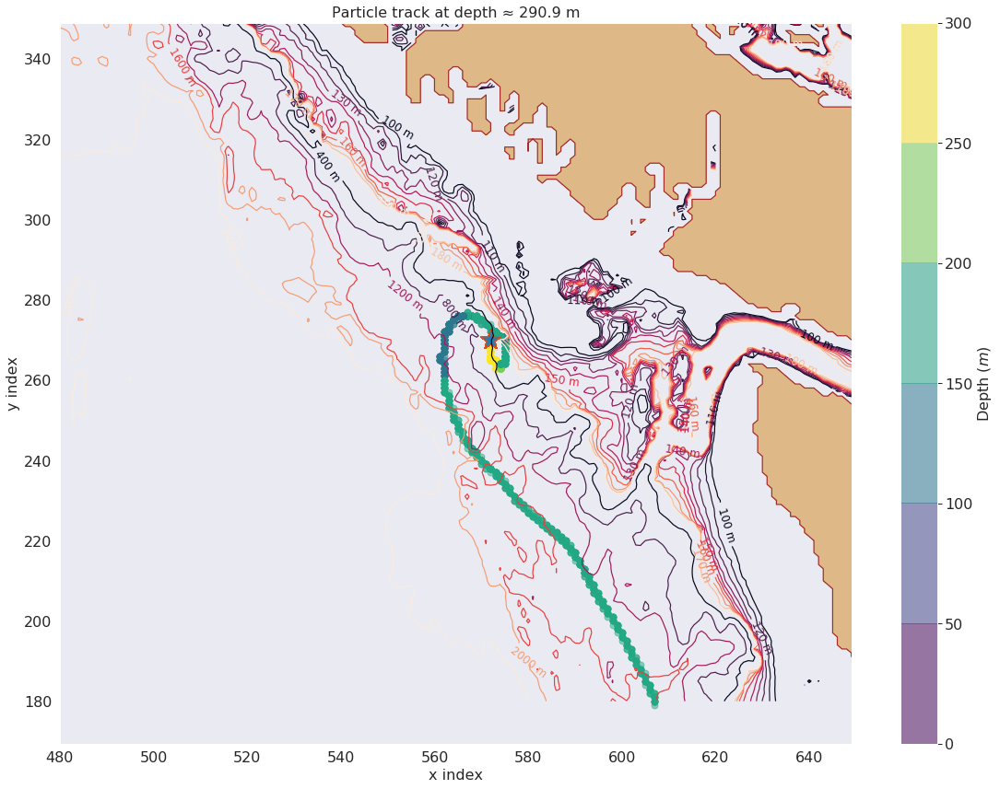

In [81]:
plot_tracks(traj_depth_level=14)

In [15]:
final_age[12]

3960000.0

In [21]:
colors = cm.hsv(np.linspace(0, 1, 15))

colors_edge = cm.afmhot_r(np.linspace(0, 1, 15))


In [22]:
sns.set_context('paper')

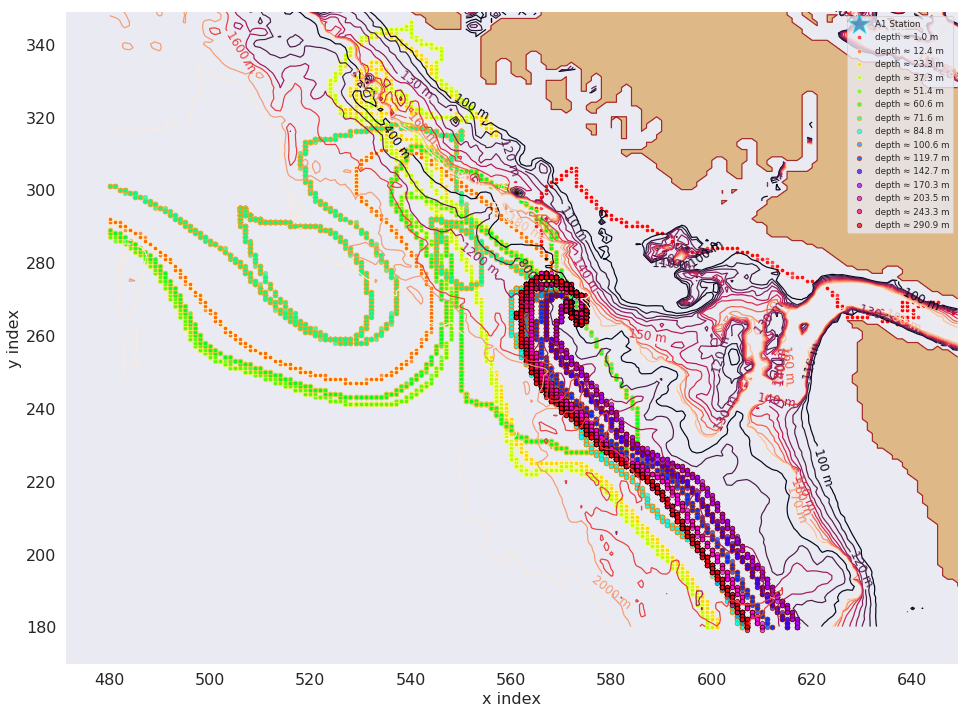

In [23]:


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]



lon_A1 = -126.20433
lat_A1 = 48.52958

y, x = geo_tools.find_closest_model_point(lon_A1,lat_A1,\
                                      lon,lat,grid='NEMO',tols=\
                                      {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                       'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})  




cmap = plt.get_cmap('plasma')
cmap.set_bad('#8b7765')

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

track1 = ax.scatter(x,y, s=500, marker = '*', alpha=0.7, edgecolor= 'cyan', label = 'A1 Station')

for traj_depth_level in np.arange(traj_depth.shape[1]):

    #     q = ax.scatter(x, y, s=300, alpha=0.7, edgecolor= 'cyan', label = 'Station A1' )


#     track1 = ax.scatter(x_wcvi_slice[np.int(np.rint(y1[traj_depth_level]))-1], y_wcvi_slice[np.int(np.rint(x1[traj_depth_level]))-1], s=500, marker = '*', alpha=0.7, edgecolor= 'cyan')
    #     track2 = ax.scatter(x_wcvi_slice[np.int(np.rint(y2[traj_depth_level]))-1], y_wcvi_slice[np.int(np.rint(x2[traj_depth_level]))-1], s=500, marker = '*', alpha=0.7, edgecolor= 'red', label = 'Initial position' )

    y = np.empty(traj_lon[:,traj_depth_level].shape[0])
    x = np.empty_like(y)

    for k in np.arange(traj_lon[:,traj_depth_level].shape[0]):
            y[k], x[k] = geo_tools.find_closest_model_point(traj_lon[k,traj_depth_level],traj_lat[k,traj_depth_level],\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
    ax.scatter(x[:], y[:], s=20, alpha=0.7, c = colors[traj_depth_level], edgecolor= colors_edge[traj_depth_level], label = 'depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,traj_depth_level])))
    ax.legend(loc = 'best')



    #     cbar = fig.colorbar(q, ax=ax)
    #     cbar.set_label(label='Spiciness', fontsize = 16)
    #     cbar.ax.tick_params(labelsize=16) 


ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


# ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,traj_depth_level])), fontsize =16)


viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
#     ax.set_ylim(220,280)
#     ax.set_xlim(575,630)
ax.grid()



In [17]:
sns.set_context('paper')

For A1 trajectories


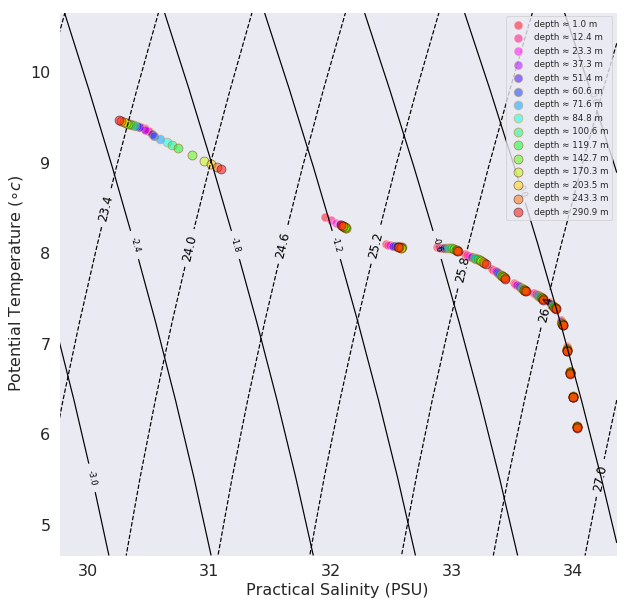

In [75]:
# colors = cmo.cm.phase(np.linspace(0, 1, 200))

print("For A1 trajectories")

# model_survey_sal_G1 = model_survey_sal_G[model_survey_sal_G>30]
# model_survey_temp_G1 = model_survey_temp_G[model_survey_sal_G>30]

# Figure out boudaries (mins and maxs)
smin = np.nanmin(traj_sal[:,0])  - (0.01 * np.nanmin(traj_sal[:,0]))
smax = np.nanmax(traj_sal[:,-1])  + (0.01 * np.nanmax(traj_sal[:,-1]))
tmin = np.nanmin(traj_tem) - (0.1 * np.nanmax(traj_tem))
tmax = np.nanmax(traj_tem[:,0]) + (0.1 * np.nanmax(traj_tem[:,0]))
 
# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens_1 = np.empty((ydim,xdim))
spic_1 = np.empty((ydim,xdim))
SA = np.empty((xdim))
CT = np.empty((ydim)) 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin
 
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        
        SA[i] = gsw.SA_from_SP(si[i], 0, np.mean(traj_lon), np.mean(traj_lat))

        CT[j] = gsw.CT_from_pt(si[i], ti[j])
        
        dens_1[j,i]=gsw.rho(SA[i],CT[j],0)
        
        spic_1[j,i] = gsw.spiciness0(SA[i],CT[j])
 
# Substract 1000 to convert to sigma-t
dens_1 = dens_1 - 1000;
 
# Plot data ***********************************************
fig1, ax = plt.subplots(1, 1, figsize=(10,10))
CS = plt.contour(si,ti,dens_1, linestyles='dashed', colors='k')
CS1 = plt.contour(si,ti,spic_1, linestyles='solid', colors='k')
plt.clabel(CS, fontsize=12, inline=1, fmt='%0.1f') # Label every second level
plt.clabel(CS1, fontsize=8, inline=1, fmt='%0.1f') # Label every second level


for traj_depth_level in np.arange(traj_depth.shape[1]):


    ax.scatter(traj_sal[traj_depth_level,:], traj_tem[traj_depth_level,:], s=80, alpha=0.5, c = colors[traj_depth_level], edgecolor= colors_edge[traj_depth_level], label = 'depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,traj_depth_level])))
    ax.legend(loc = 'best')




# ax.plot(model_survey_sal_A ,model_survey_temp_A,'o', color= colors[0,:], alpha = 0.5, markersize=3, label='Model at Survey A')

# ax.plot(model_survey_sal_B ,model_survey_temp_B, 'o',color= colors[30,:],alpha = 0.5,  markersize=3, label='Model at Survey B')

# ax.plot(model_survey_sal_D ,model_survey_temp_D, 'o',color= colors[60,:],alpha = 0.5,  markersize=3, label='Model at Survey D')

# ax.plot(model_survey_sal_E ,model_survey_temp_E, 'o',color= colors[90,:], alpha = 0.5, markersize=3, label='Model at Survey E')

# ax.plot(model_survey_sal_G1 ,model_survey_temp_G1, 'o',color= colors[120,:], alpha = 0.5, markersize=3, label='Model at Survey G')

# ax.plot(SA_loc_f, CT_loc_f, 'o' ,markersize=9, label = 'Eddy west front')
# ax.set_ylim(5,18)
# ax.set_xlim(30,34)
 
ax.set_xlabel('Practical Salinity (PSU)', fontsize = 16)
ax.set_ylabel('Potential Temperature ($\circ c$)', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)
# ax.set_xlim(30,34.5)


# legend = ax.legend(loc='upper right', fancybox=True, framealpha=0.25)

In [29]:
lon_A1 = -126.20433
lat_A1 = 48.52958

y, x = geo_tools.find_closest_model_point(lon_A1,lat_A1,\
                                      lon,lat,grid='NEMO',tols=\
                                      {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                       'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})  

In [18]:
colors = cm.hsv_r(np.linspace(0, 1, 15))

colors_edge = cm.afmhot_r(np.linspace(0, 1, 15))


In [28]:
traj_depth.shape[1]

15

In [27]:
colors = cm.hsv_r(np.linspace(0, 1, 11))

colors_edge = cm.afmhot_r(np.linspace(0, 1, 11))


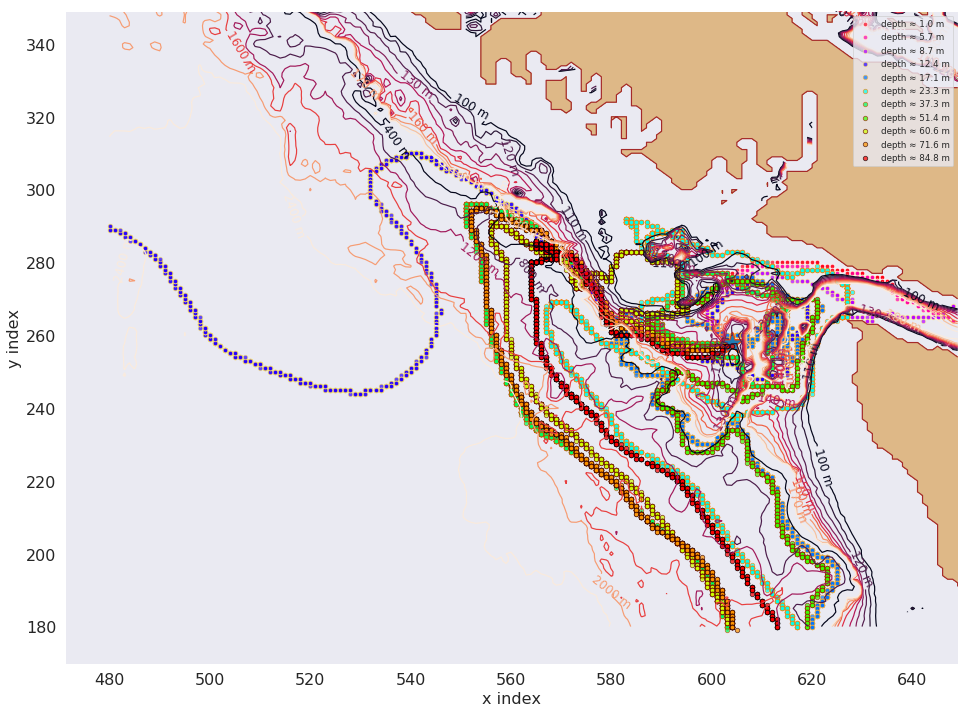

In [28]:


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]



cmap = plt.get_cmap('plasma')
cmap.set_bad('#8b7765')

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

# track1 = ax.scatter(x,y, s=200, marker = '*', alpha=0.7, edgecolor= 'red')

for traj_depth_level in np.arange(traj_depth.shape[1]):

    #     q = ax.scatter(x, y, s=300, alpha=0.7, edgecolor= 'cyan', label = 'Station A1' )


    track1 = ax.scatter(x_wcvi_slice[np.int(np.rint(x1[traj_depth_level]))-1], y_wcvi_slice[np.int(np.rint(y1[traj_depth_level]))-1], s=500, marker = '*', alpha=0.9, edgecolor= 'orangered')
    #     track2 = ax.scatter(x_wcvi_slice[np.int(np.rint(y2[traj_depth_level]))-1], y_wcvi_slice[np.int(np.rint(x2[traj_depth_level]))-1], s=500, marker = '*', alpha=0.7, edgecolor= 'red', label = 'Initial position' )

    y = np.empty(traj_lon[:,traj_depth_level].shape[0])
    x = np.empty_like(y)

    for k in np.arange(traj_lon[:,traj_depth_level].shape[0]):
            y[k], x[k] = geo_tools.find_closest_model_point(traj_lon[k,traj_depth_level],traj_lat[k,traj_depth_level],\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
    ax.scatter(x[:], y[:], s=20, alpha=0.7, c = colors[traj_depth_level], edgecolor= colors_edge[traj_depth_level], label = 'depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,traj_depth_level])))
    ax.legend(loc = 'best')



    #     cbar = fig.colorbar(q, ax=ax)
    #     cbar.set_label(label='Spiciness', fontsize = 16)
    #     cbar.ax.tick_params(labelsize=16) 


ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


# ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,traj_depth_level])), fontsize =16)


viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
#     ax.set_ylim(220,280)
#     ax.set_xlim(575,630)
ax.grid()



Start of particles are 26th August


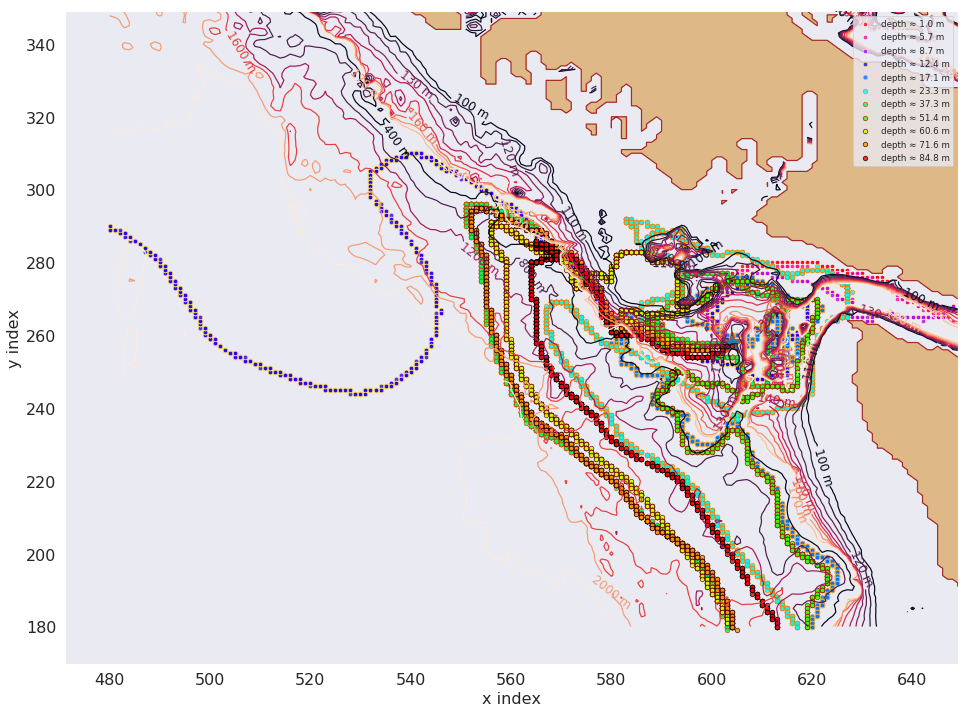

In [34]:
print("Start of particles are 26th August")



bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]



cmap = plt.get_cmap('plasma')
cmap.set_bad('#8b7765')

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

# track1 = ax.scatter(x,y, s=200, marker = '*', alpha=0.7, edgecolor= 'red')

for traj_depth_level in np.arange(traj_depth.shape[1]):

    #     q = ax.scatter(x, y, s=300, alpha=0.7, edgecolor= 'cyan', label = 'Station A1' )


    track1 = ax.scatter(x_wcvi_slice[np.int(np.rint(x1[traj_depth_level]))-1], y_wcvi_slice[np.int(np.rint(y1[traj_depth_level]))-1], s=500, marker = '*', alpha=0.9, edgecolor= 'orangered')
    #     track2 = ax.scatter(x_wcvi_slice[np.int(np.rint(y2[traj_depth_level]))-1], y_wcvi_slice[np.int(np.rint(x2[traj_depth_level]))-1], s=500, marker = '*', alpha=0.7, edgecolor= 'red', label = 'Initial position' )

    y = np.empty(traj_lon[:,traj_depth_level].shape[0])
    x = np.empty_like(y)

    for k in np.arange(traj_lon[:,traj_depth_level].shape[0]):
            y[k], x[k] = geo_tools.find_closest_model_point(traj_lon[k,traj_depth_level],traj_lat[k,traj_depth_level],\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
    ax.scatter(x[:], y[:], s=20, alpha=0.8, c = colors[traj_depth_level], edgecolor= colors_edge[traj_depth_level], label = 'depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,traj_depth_level])))
    ax.legend(loc = 'best')



    #     cbar = fig.colorbar(q, ax=ax)
    #     cbar.set_label(label='Spiciness', fontsize = 16)
    #     cbar.ax.tick_params(labelsize=16) 


ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


# ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,traj_depth_level])), fontsize =16)


viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
#     ax.set_ylim(220,280)
#     ax.set_xlim(575,630)
ax.grid()



/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


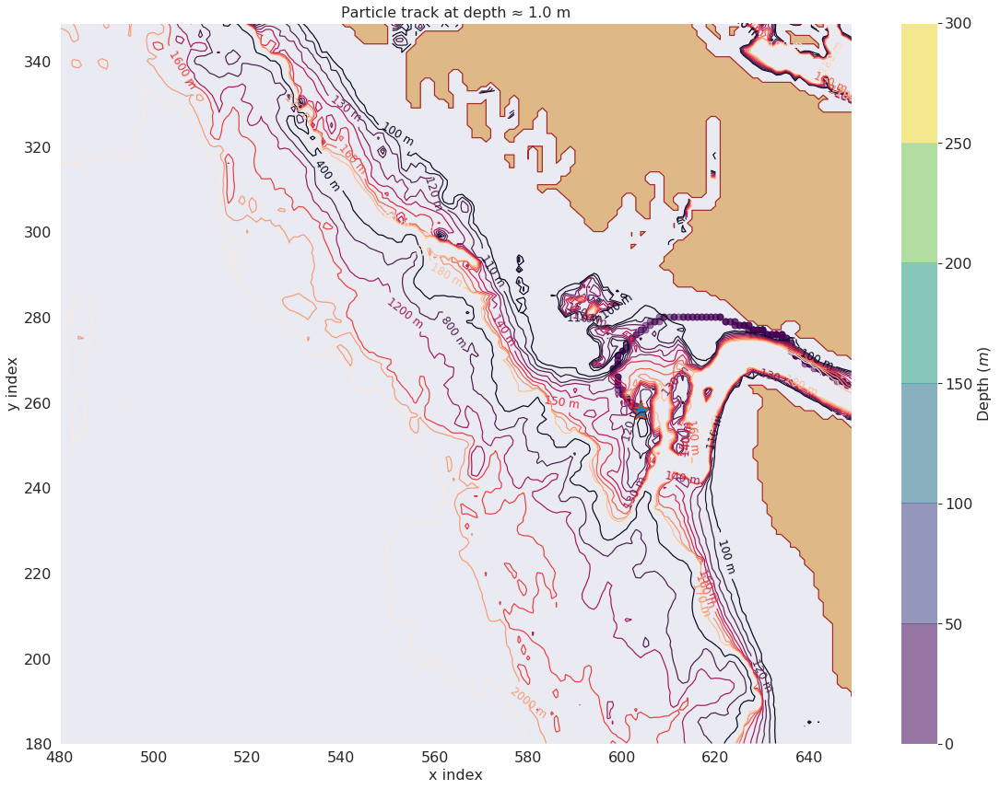

In [51]:
plot_tracks(traj_depth_level=0)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


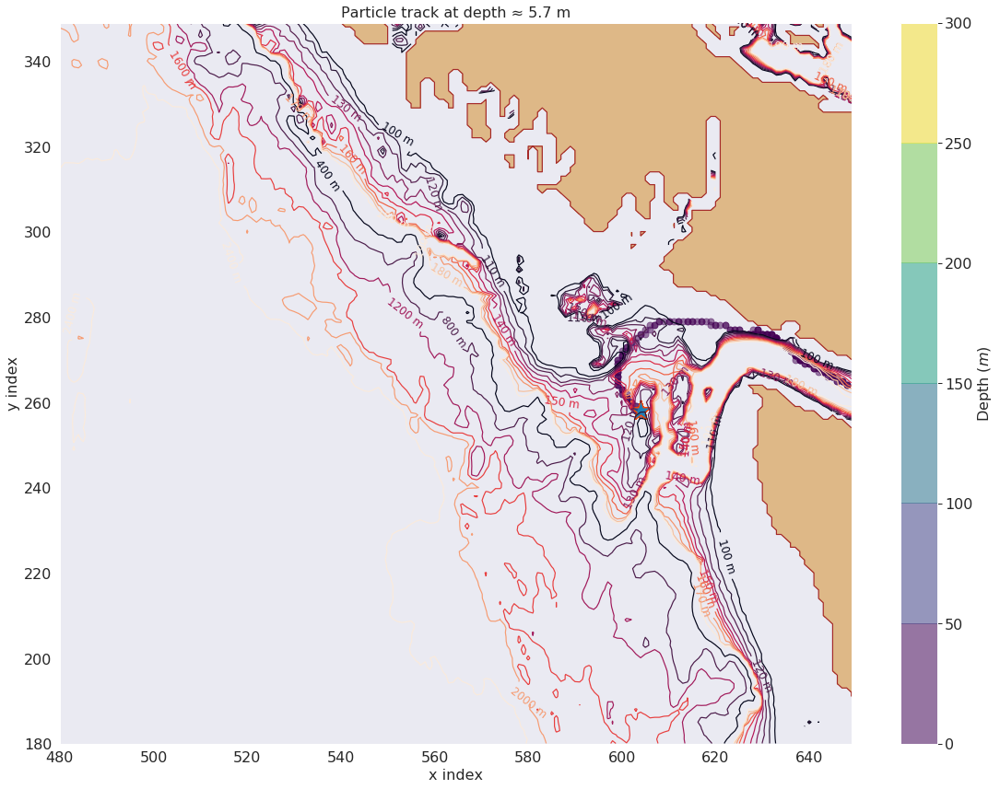

In [57]:
plot_tracks(traj_depth_level=1)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


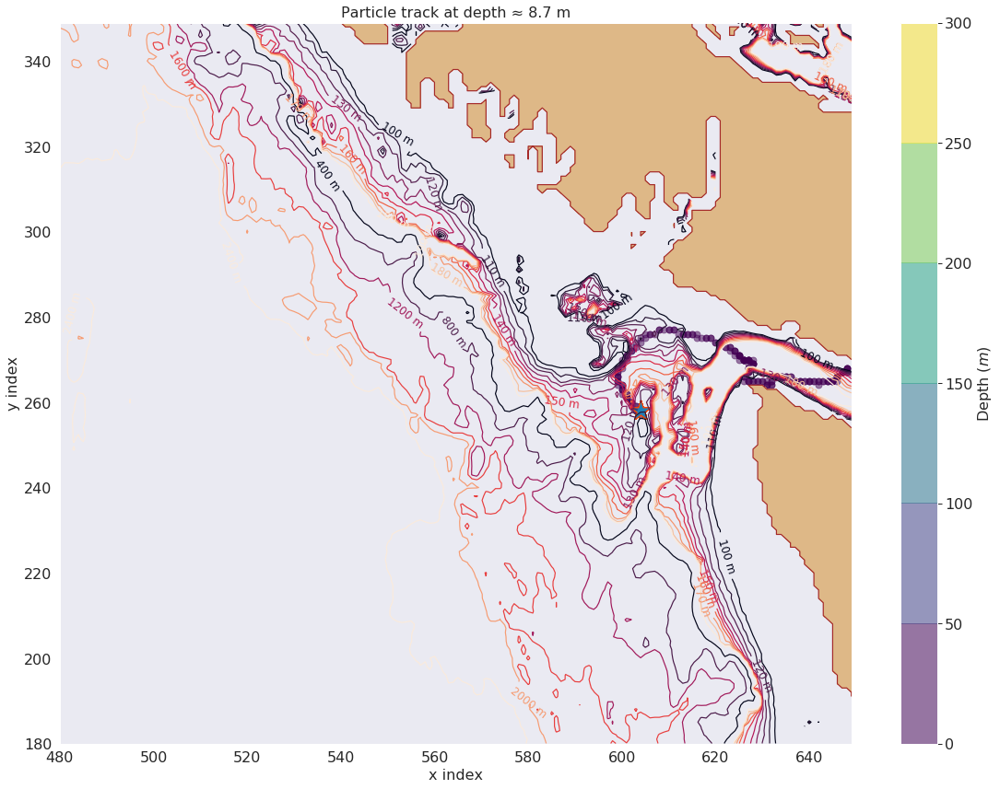

In [55]:
plot_tracks(traj_depth_level=2)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


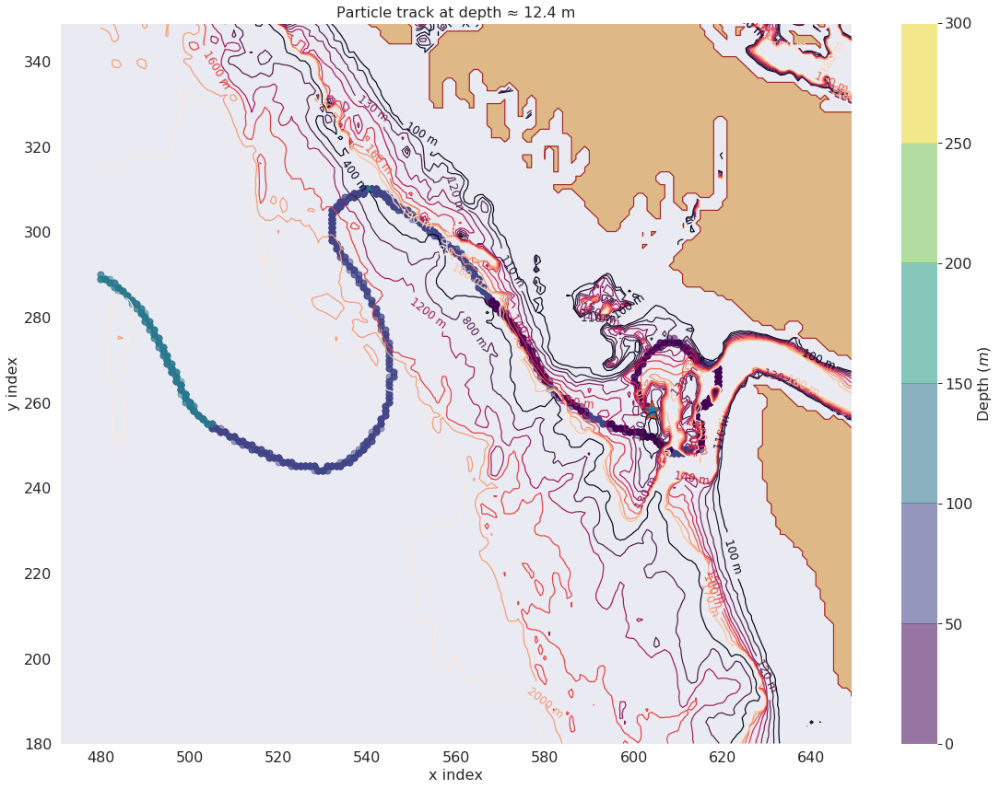

In [56]:
plot_tracks(traj_depth_level=3)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


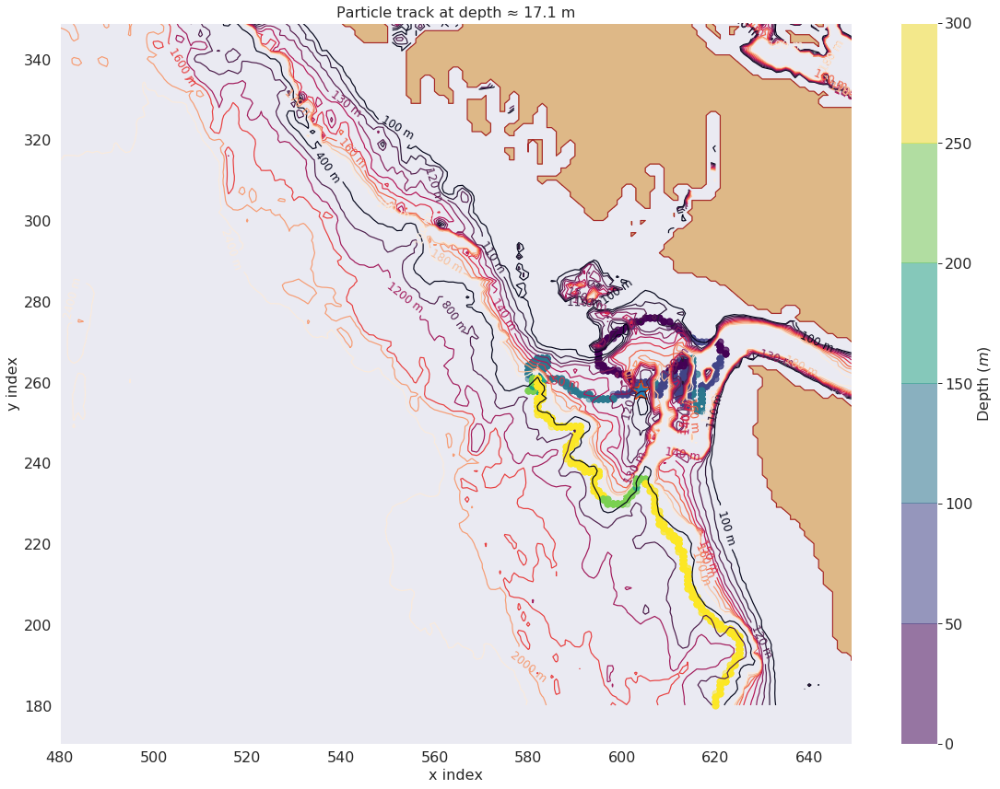

In [50]:
plot_tracks(traj_depth_level=4)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


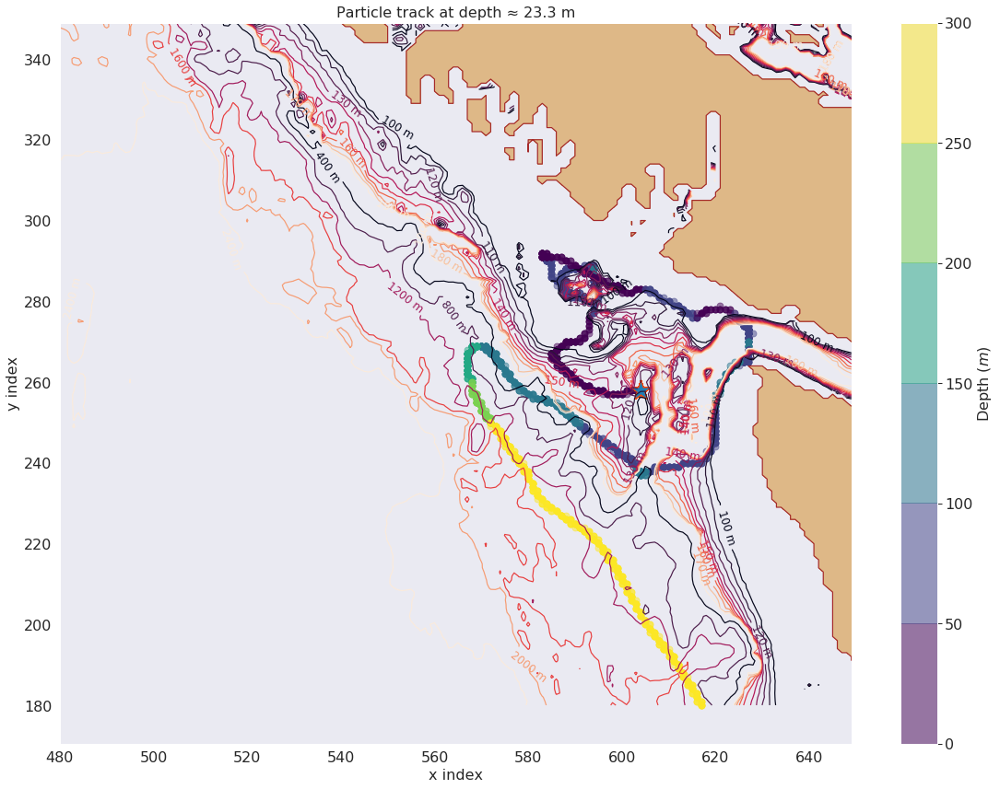

In [54]:
plot_tracks(traj_depth_level=5)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


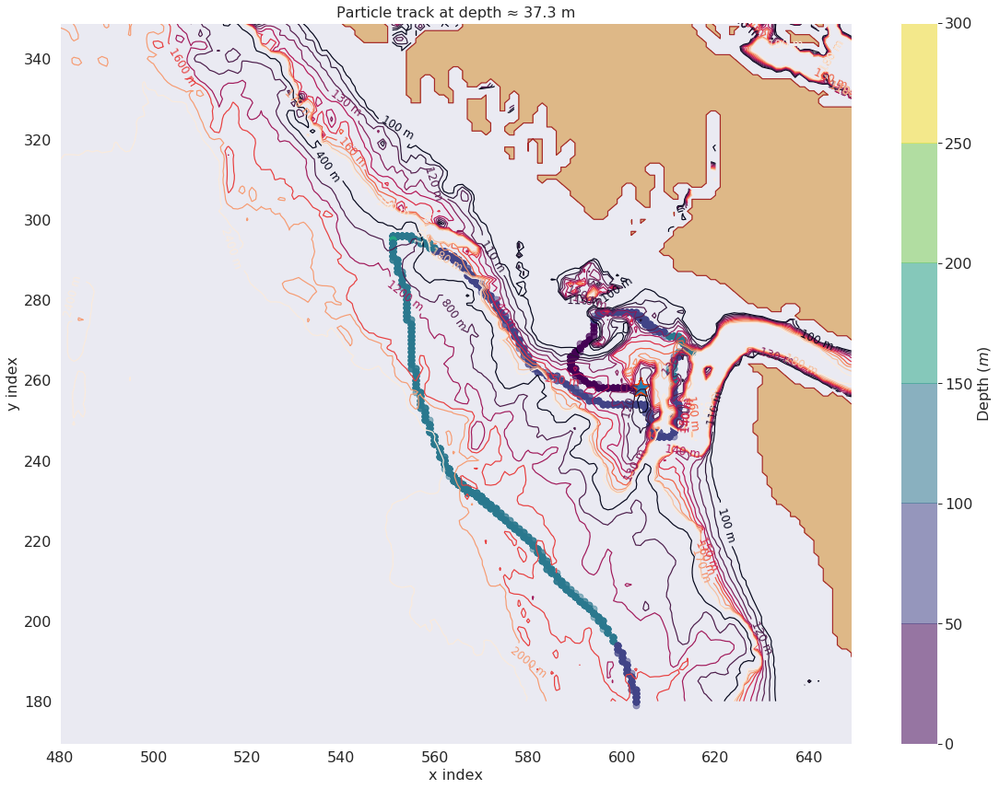

In [49]:
plot_tracks(traj_depth_level=6)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


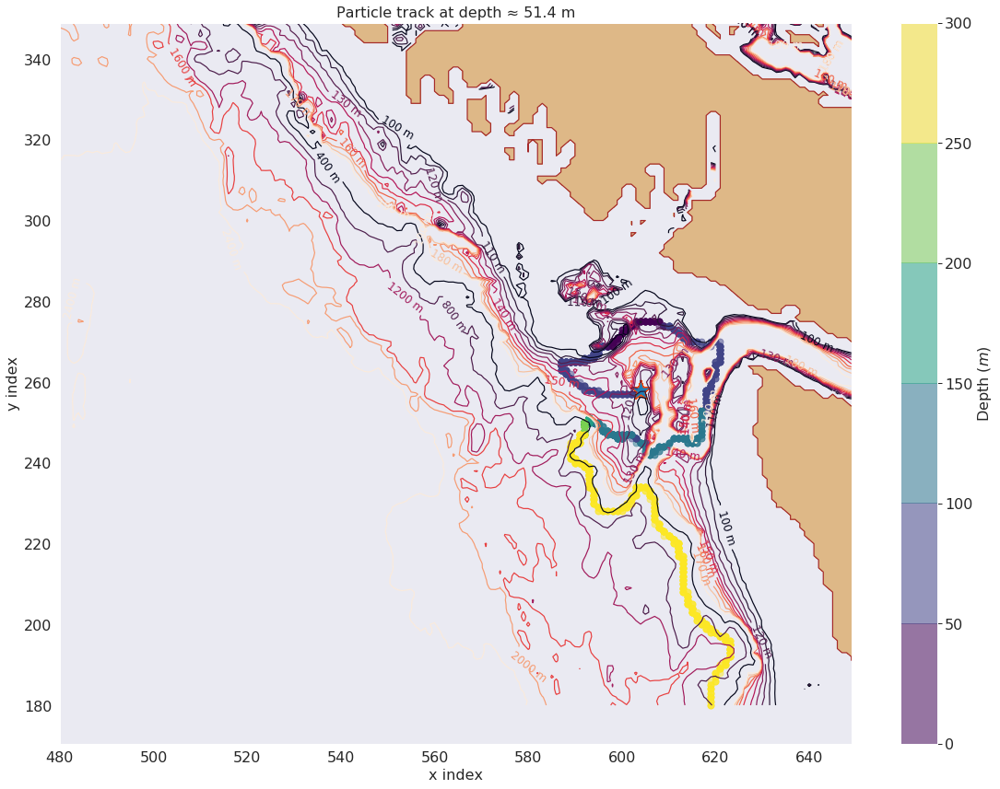

In [52]:
plot_tracks(traj_depth_level=7)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


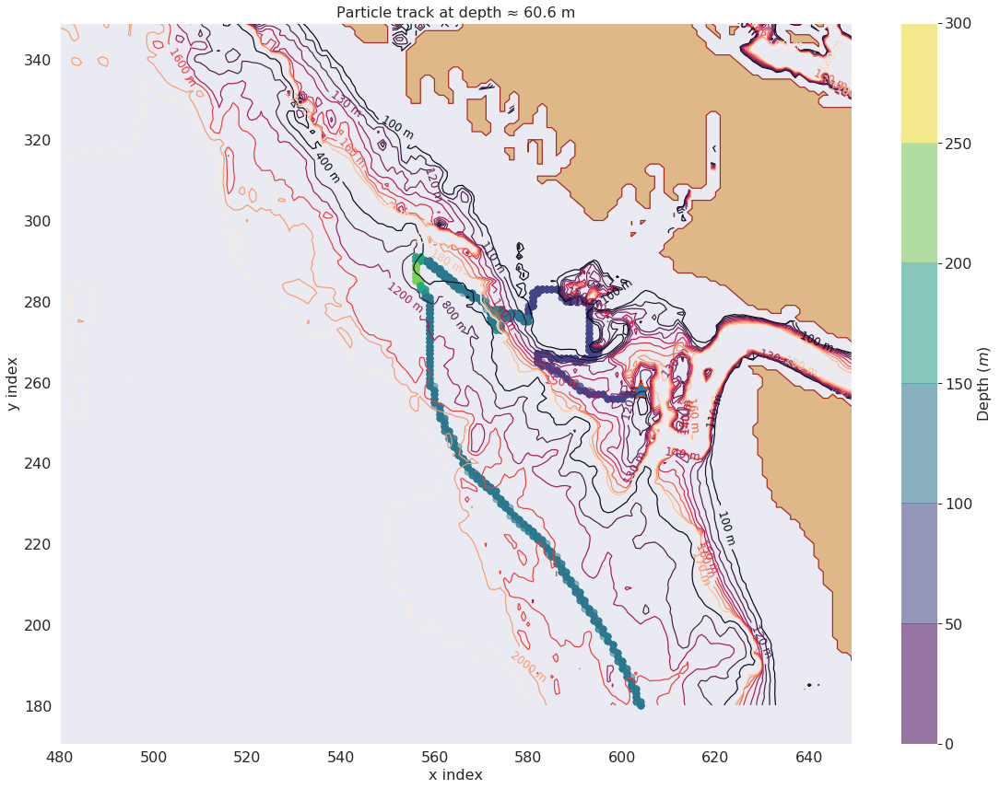

In [48]:
plot_tracks(traj_depth_level=8)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


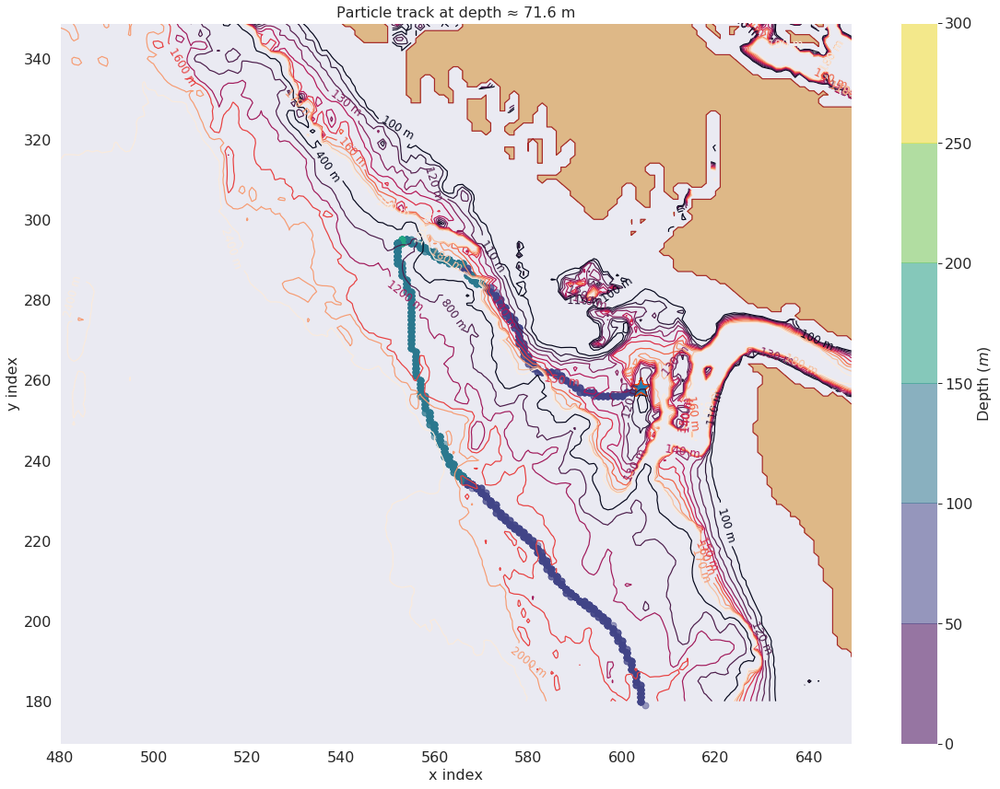

In [53]:
plot_tracks(traj_depth_level=9)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


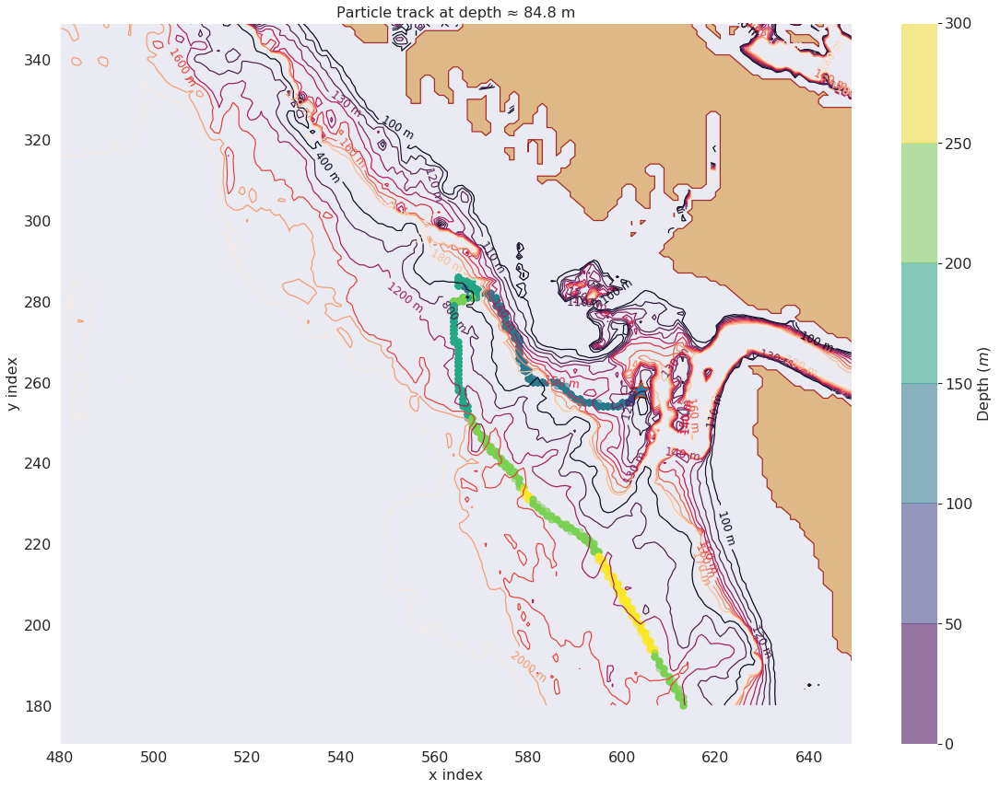

In [47]:
plot_tracks(traj_depth_level=10)

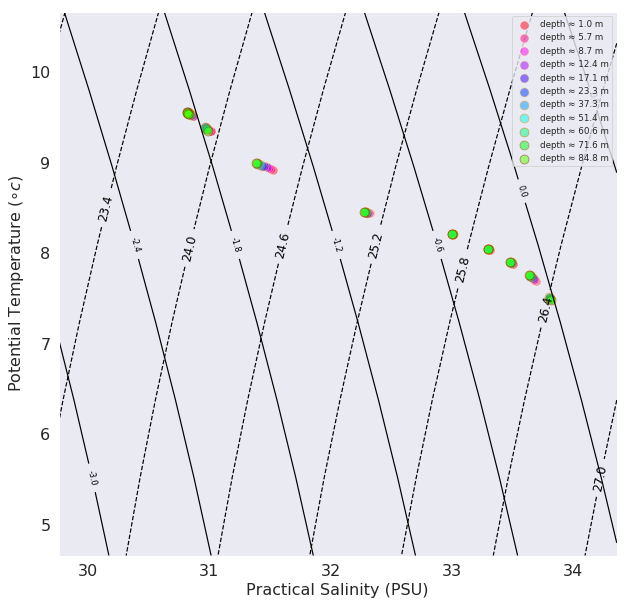

In [70]:

# Plot data ***********************************************
fig1, ax = plt.subplots(1, 1, figsize=(10,10))
CS = plt.contour(si,ti,dens_1, linestyles='dashed', colors='k')
CS1 = plt.contour(si,ti,spic_1, linestyles='solid', colors='k')
plt.clabel(CS, fontsize=12, inline=1, fmt='%0.1f') # Label every second level
plt.clabel(CS1, fontsize=8, inline=1, fmt='%0.1f') # Label every second level


for traj_depth_level in np.arange(traj_depth.shape[1]):


    ax.scatter(traj_sal[traj_depth_level,:], traj_tem[traj_depth_level,:], s=80, alpha=0.5, c = colors[traj_depth_level], edgecolor= colors_edge[traj_depth_level], label = 'depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,traj_depth_level])))
    ax.legend(loc = 'best')




# ax.plot(model_survey_sal_A ,model_survey_temp_A,'o', color= colors[0,:], alpha = 0.5, markersize=3, label='Model at Survey A')

# ax.plot(model_survey_sal_B ,model_survey_temp_B, 'o',color= colors[30,:],alpha = 0.5,  markersize=3, label='Model at Survey B')

# ax.plot(model_survey_sal_D ,model_survey_temp_D, 'o',color= colors[60,:],alpha = 0.5,  markersize=3, label='Model at Survey D')

# ax.plot(model_survey_sal_E ,model_survey_temp_E, 'o',color= colors[90,:], alpha = 0.5, markersize=3, label='Model at Survey E')

# ax.plot(model_survey_sal_G1 ,model_survey_temp_G1, 'o',color= colors[120,:], alpha = 0.5, markersize=3, label='Model at Survey G')

# ax.plot(SA_loc_f, CT_loc_f, 'o' ,markersize=9, label = 'Eddy west front')
# ax.set_ylim(5,18)
# ax.set_xlim(30,34)
 
ax.set_xlabel('Practical Salinity (PSU)', fontsize = 16)
ax.set_ylabel('Potential Temperature ($\circ c$)', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)
# ax.set_xlim(30.5,34)
# ax.set_ylim(7,10)


# legend = ax.legend(loc='upper right', fancybox=True, framealpha=0.25)

In [50]:
colors = cm.hsv_r(np.linspace(0, 1, traj_depth.shape[1]))

colors_edge = cm.afmhot_r(np.linspace(0, 1, traj_depth.shape[1]))


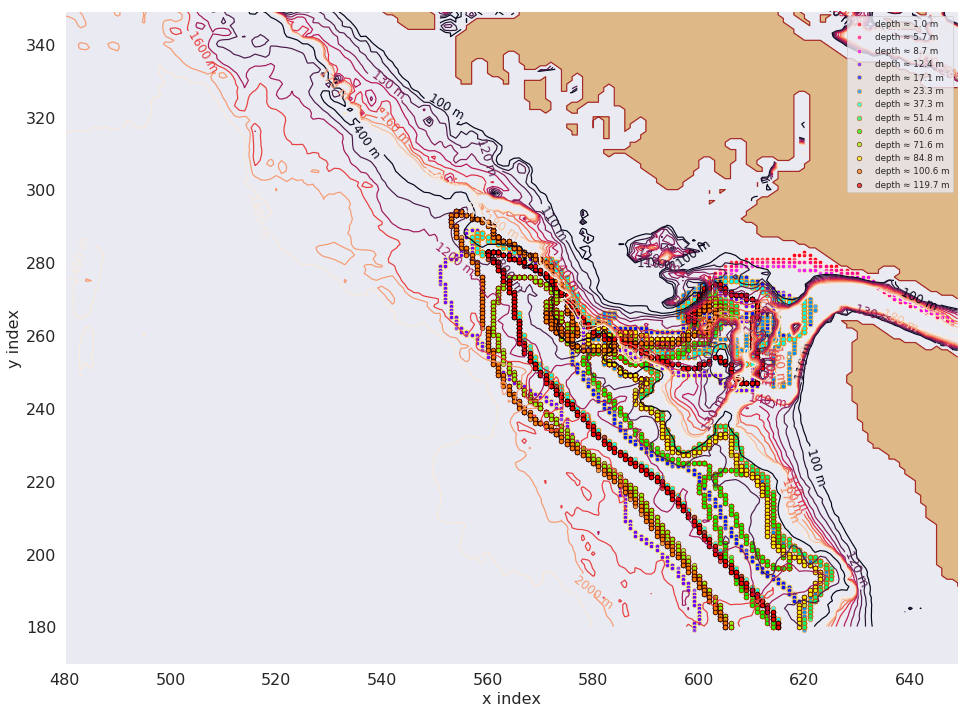

In [51]:


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]



cmap = plt.get_cmap('plasma')
cmap.set_bad('#8b7765')

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

# track1 = ax.scatter(x,y, s=200, marker = '*', alpha=0.7, edgecolor= 'red')

for traj_depth_level in np.arange(traj_depth.shape[1]):

    #     q = ax.scatter(x, y, s=300, alpha=0.7, edgecolor= 'cyan', label = 'Station A1' )


    track1 = ax.scatter(x_wcvi_slice[np.int(np.rint(x1[traj_depth_level]))-1], y_wcvi_slice[np.int(np.rint(y1[traj_depth_level]))-1], s=500, marker = '*', alpha=0.9, edgecolor= 'orangered')
    #     track2 = ax.scatter(x_wcvi_slice[np.int(np.rint(y2[traj_depth_level]))-1], y_wcvi_slice[np.int(np.rint(x2[traj_depth_level]))-1], s=500, marker = '*', alpha=0.7, edgecolor= 'red', label = 'Initial position' )

    y = np.empty(traj_lon[:,traj_depth_level].shape[0])
    x = np.empty_like(y)

    for k in np.arange(traj_lon[:,traj_depth_level].shape[0]):
            y[k], x[k] = geo_tools.find_closest_model_point(traj_lon[k,traj_depth_level],traj_lat[k,traj_depth_level],\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
    ax.scatter(x[:], y[:], s=20, alpha=0.7, c = colors[traj_depth_level], edgecolor= colors_edge[traj_depth_level], label = 'depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,traj_depth_level])))
    ax.legend(loc = 'best')



    #     cbar = fig.colorbar(q, ax=ax)
    #     cbar.set_label(label='Spiciness', fontsize = 16)
    #     cbar.ax.tick_params(labelsize=16) 


ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


# ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,traj_depth_level])), fontsize =16)


viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
#     ax.set_ylim(220,280)
#     ax.set_xlim(575,630)
ax.grid()



/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


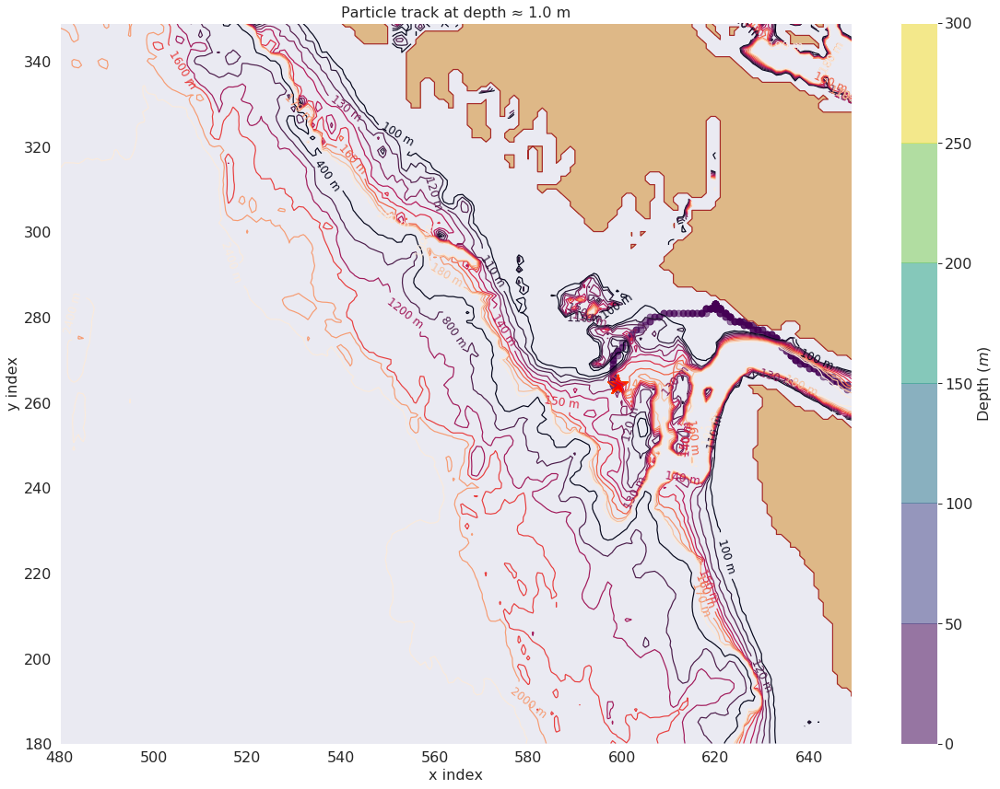

In [59]:
plot_tracks(traj_depth_level=0)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


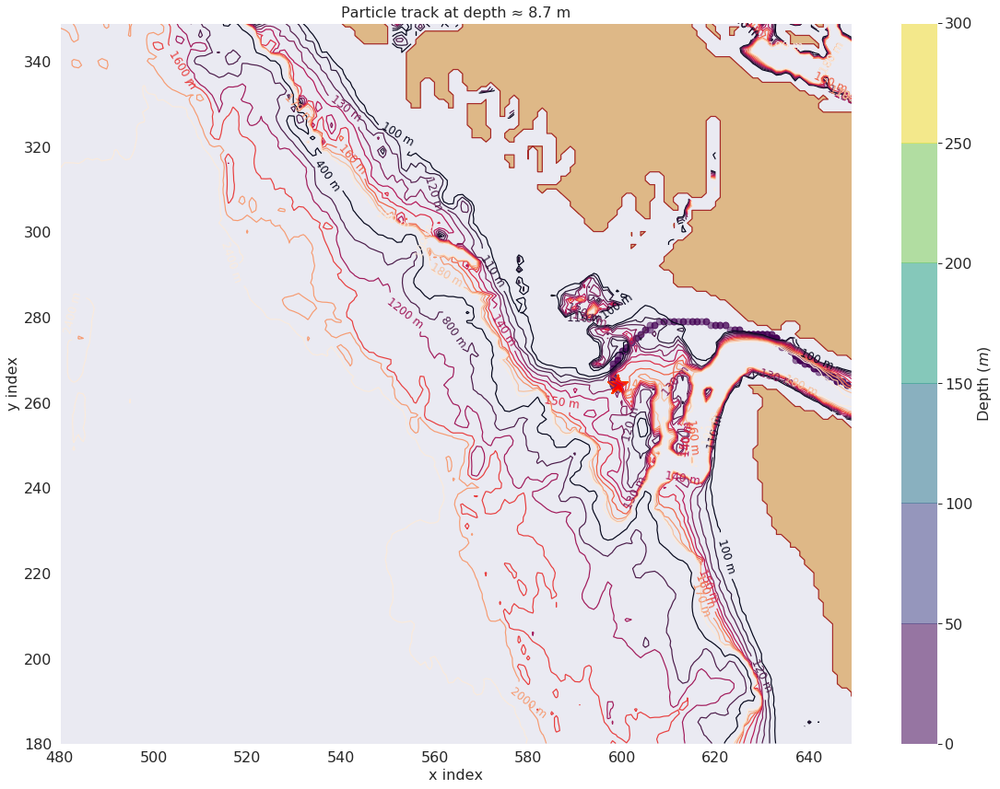

In [58]:
plot_tracks(traj_depth_level=2)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


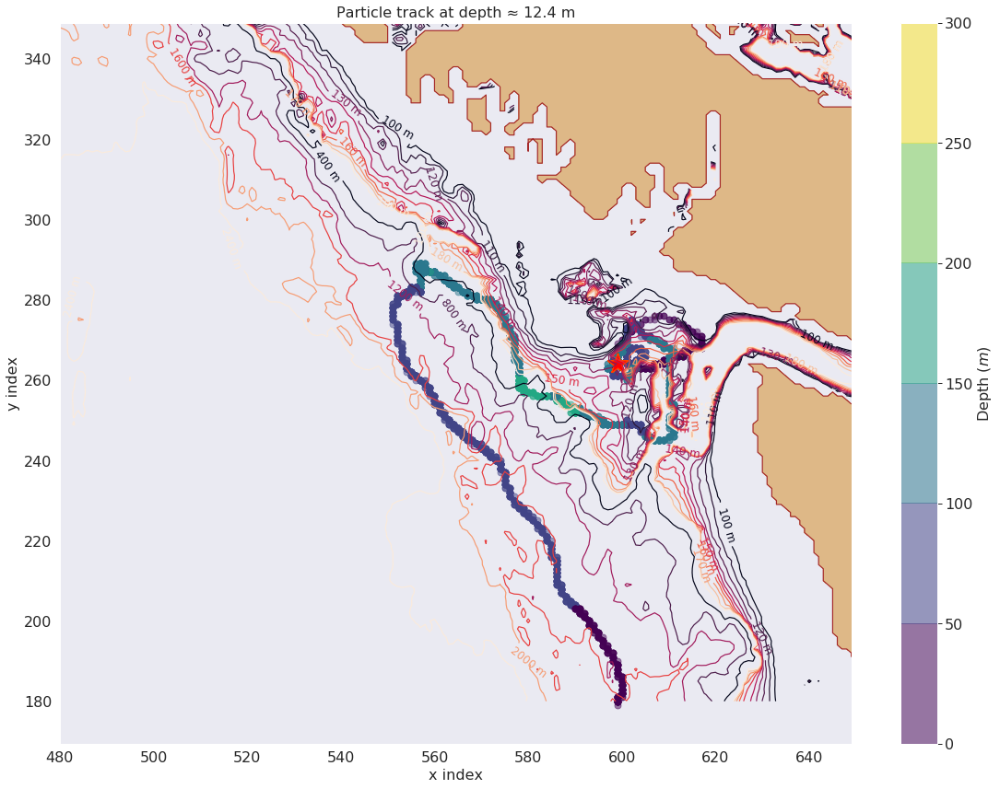

In [116]:
plot_tracks(traj_depth_level=3)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


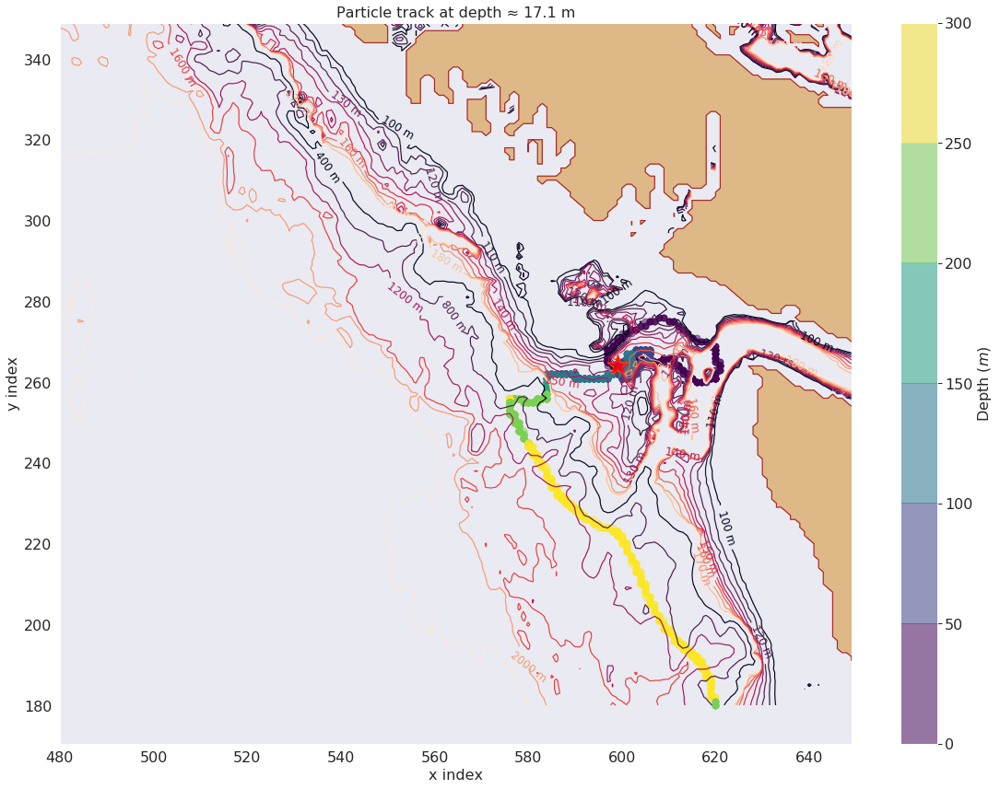

In [57]:
plot_tracks(traj_depth_level=4)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


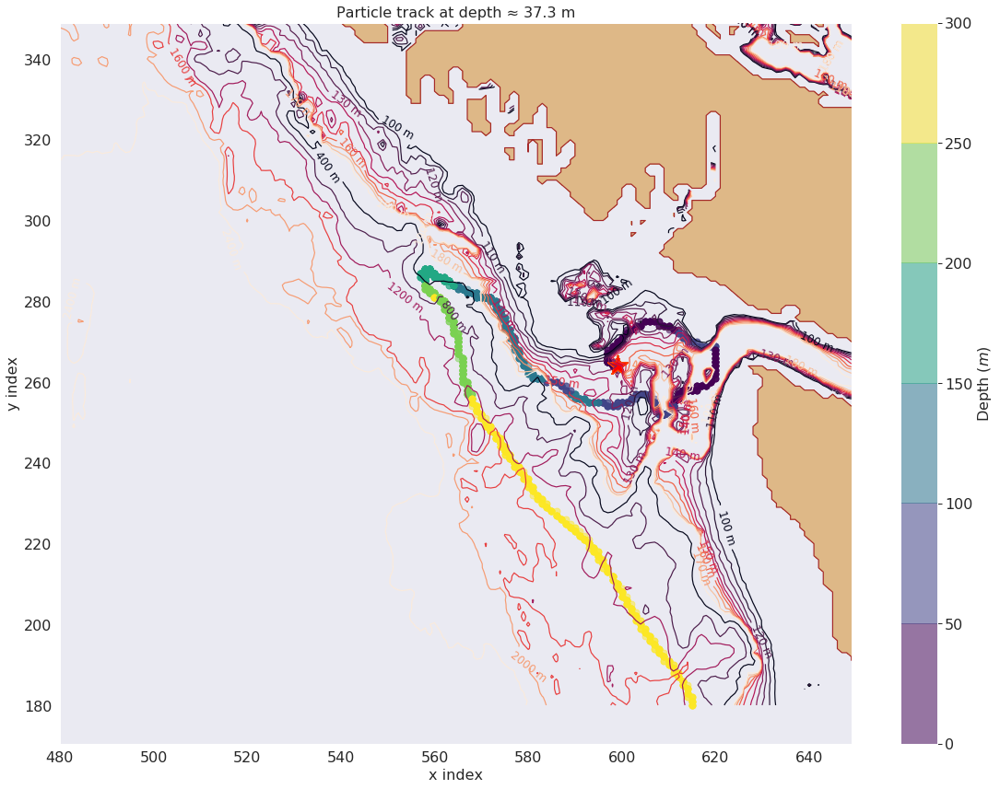

In [56]:
plot_tracks(traj_depth_level=6)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


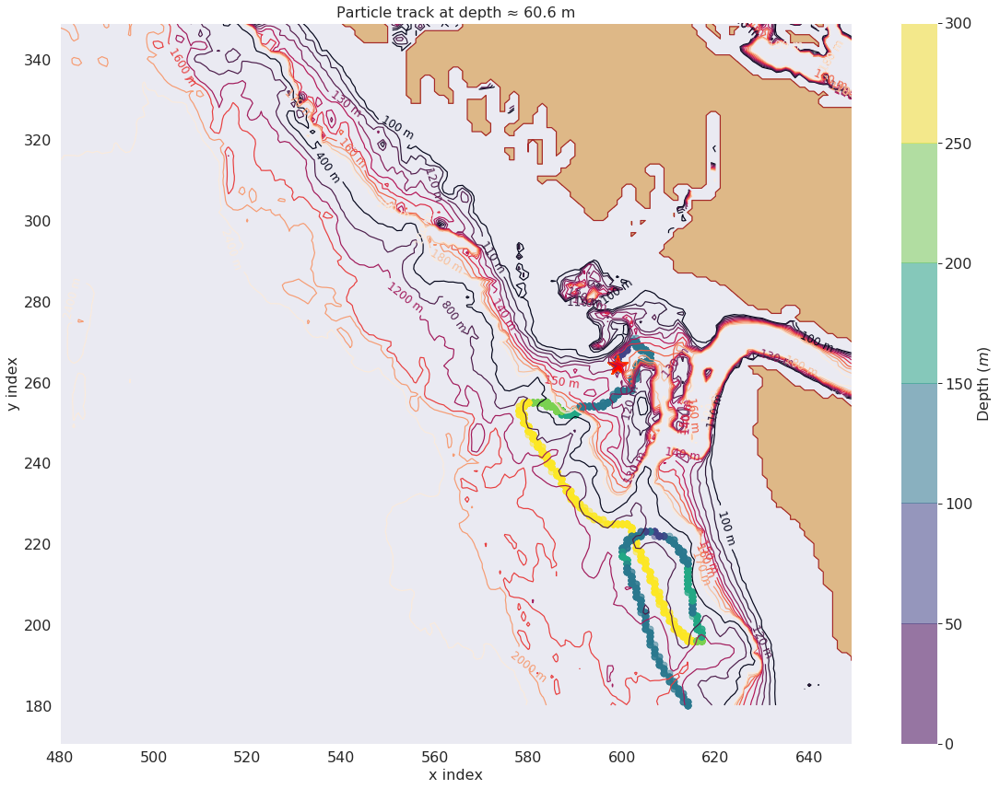

In [55]:
plot_tracks(traj_depth_level=8)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


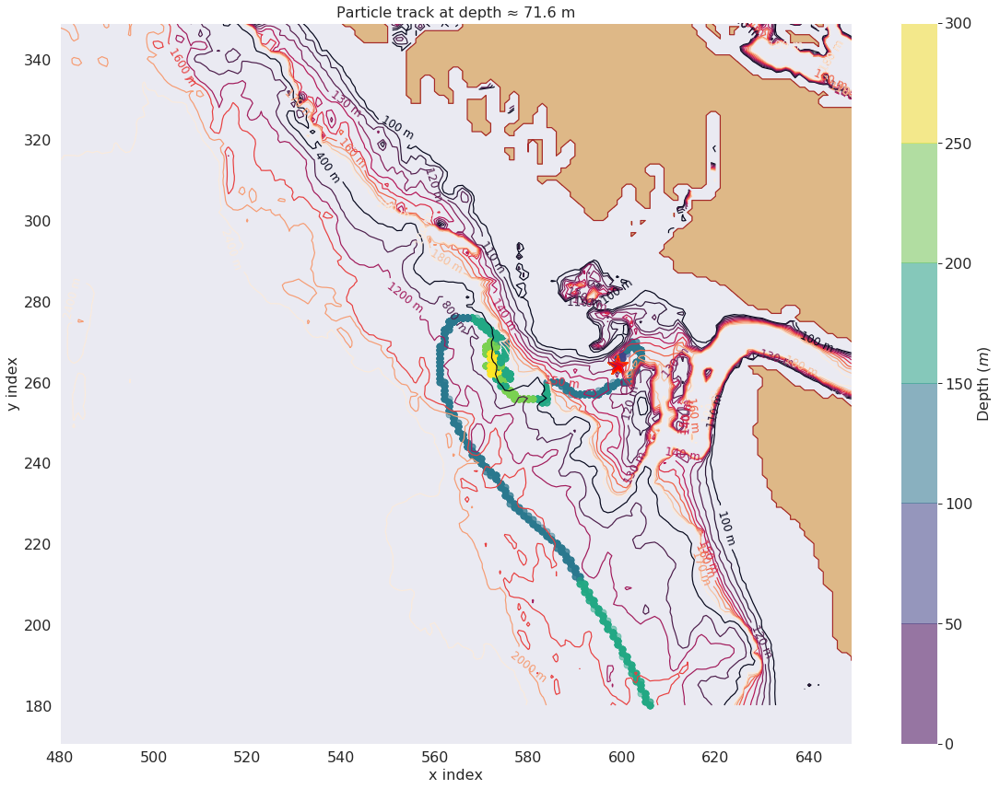

In [54]:
plot_tracks(traj_depth_level=9)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


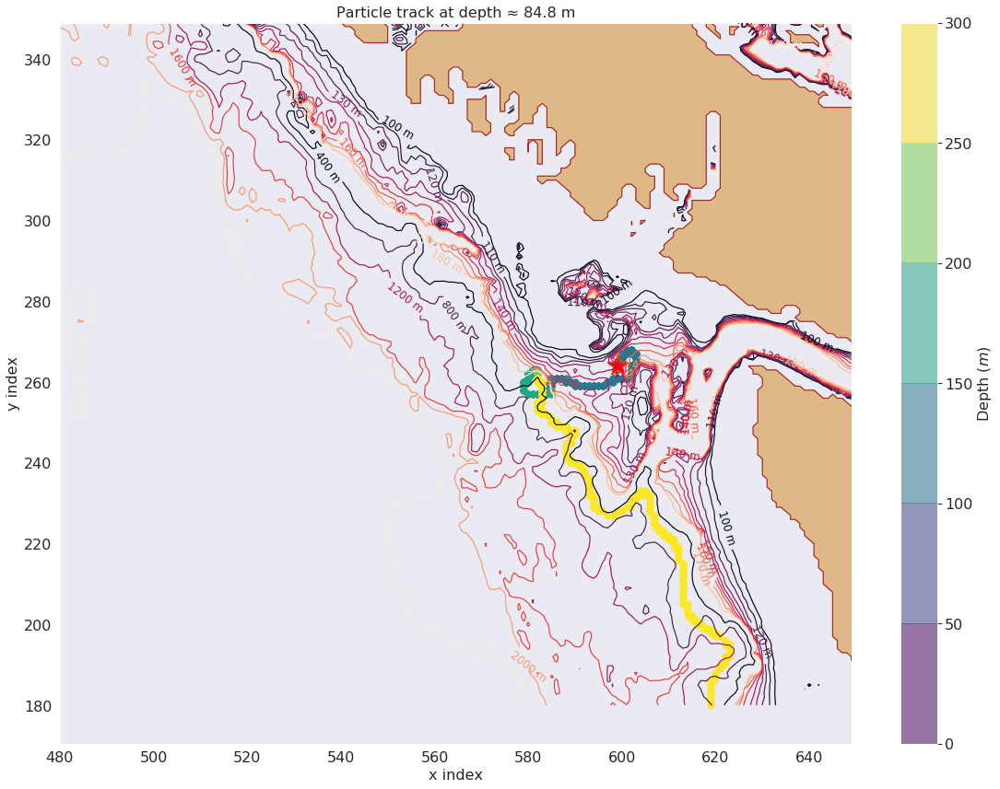

In [49]:
plot_tracks(traj_depth_level=10)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


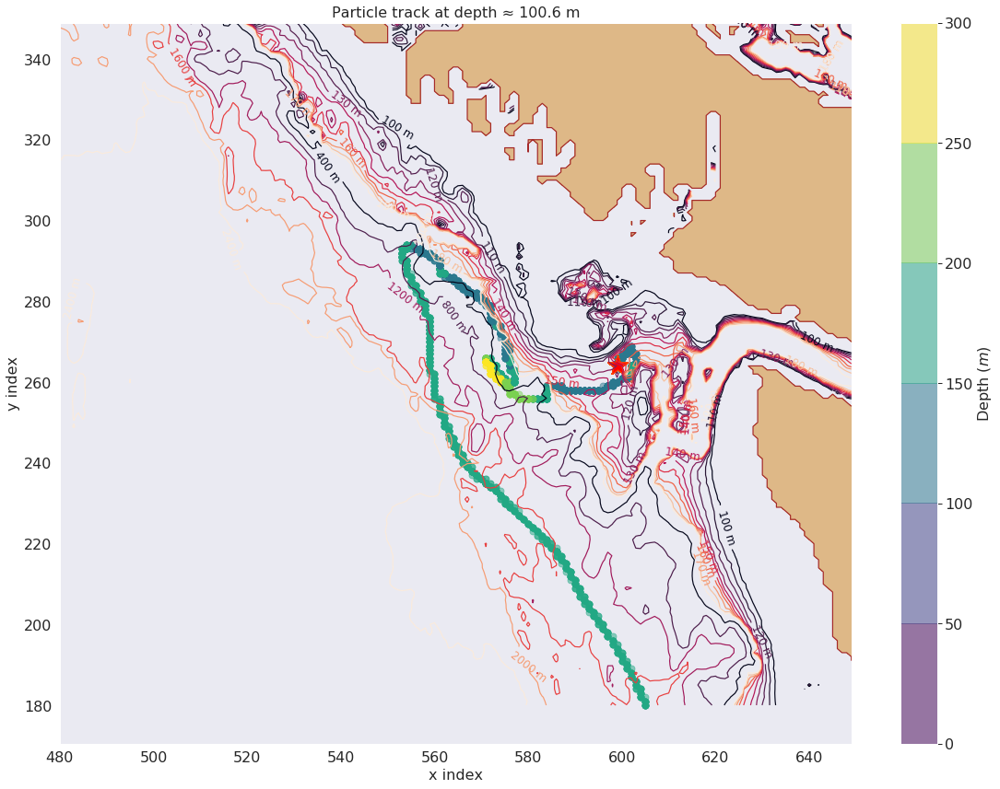

In [53]:
plot_tracks(traj_depth_level=11)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


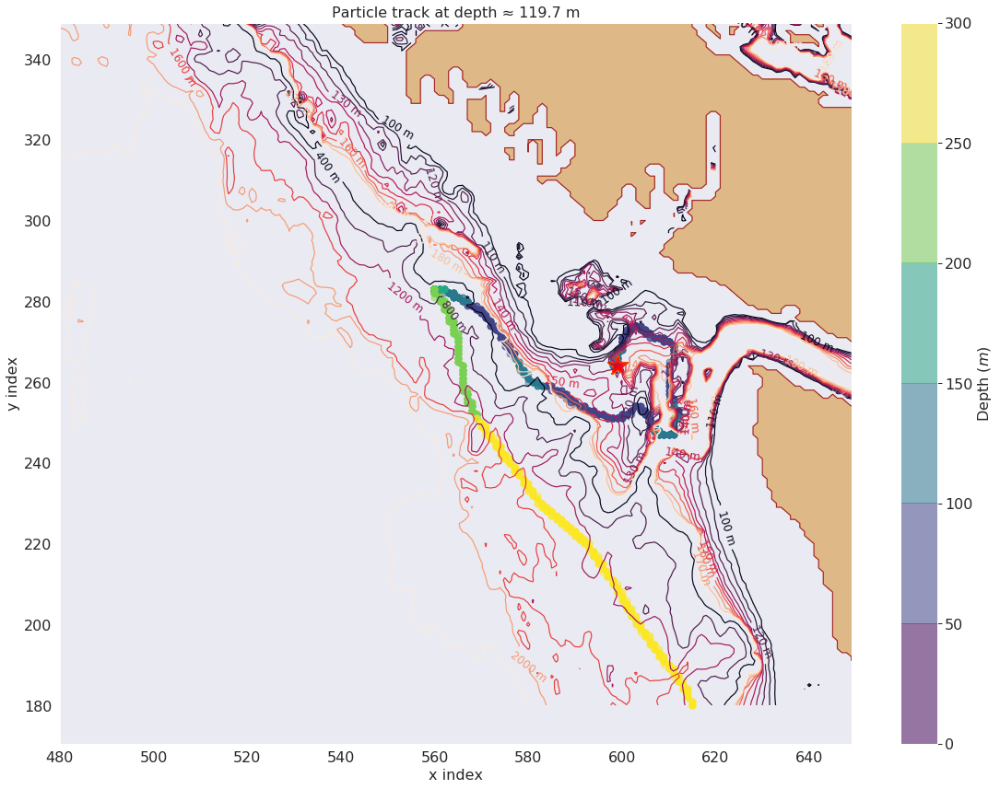

In [52]:
plot_tracks(traj_depth_level=12)

In [62]:
traj_depth.shape

(3921, 13)

In [64]:
traj_time.shape

(3921, 13)

In [75]:
np.max(traj_time[:,-1])

91.541666666666671

In [76]:
traj_time[:,-1].shape

(3921,)

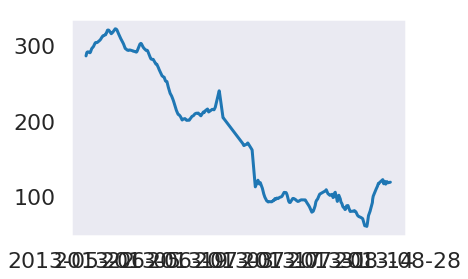

In [97]:
date1 = '2013-08-26'
date2 = '2013-04-29'
mydates = pd.date_range(date2, date1, freq= '60min')

plt.plot(np.flip(mydates, axis=0), np.multiply(-1,traj_depth[:mydates_Newport.shape[0],-1]))

In [112]:
sns.set_context('paper')

At LB08


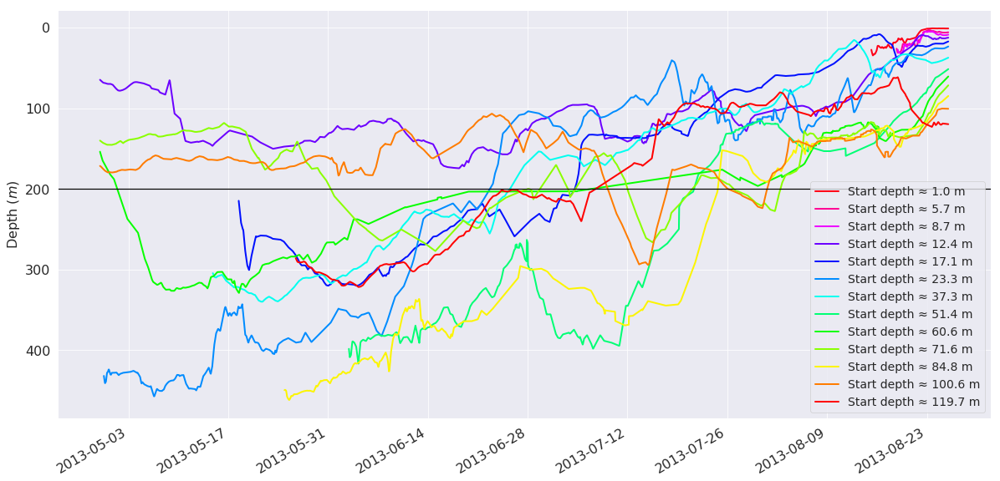

In [136]:
print("At LB08")
fig, ax1 = plt.subplots(1, 1, figsize=(20,10))

for traj_depth_level in np.arange(traj_depth.shape[1]):

    ax1.plot(np.flip(mydates, axis=0) , np.multiply(-1,traj_depth[:mydates_Newport.shape[0],traj_depth_level]) , color = colors[traj_depth_level] ,linewidth=2, \
            label = 'Start depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,traj_depth_level])))


ax1.axhline(y=200, color = 'k')

ax1.tick_params(axis='both',labelsize =16)
ax1.set_ylabel('Depth ($m$)', fontsize = 16)# and Wind stress (*10^3) (N/m^2)', fontsize = 16)
ax1.grid()
ax1.tick_params(axis='both',labelsize =16, color = colors[traj_depth_level])

ax1.set_ylim(ax1.get_ylim()[::-1]) 
ax1.legend(loc='best', fontsize = 14)
fig.autofmt_xdate()



At LB08


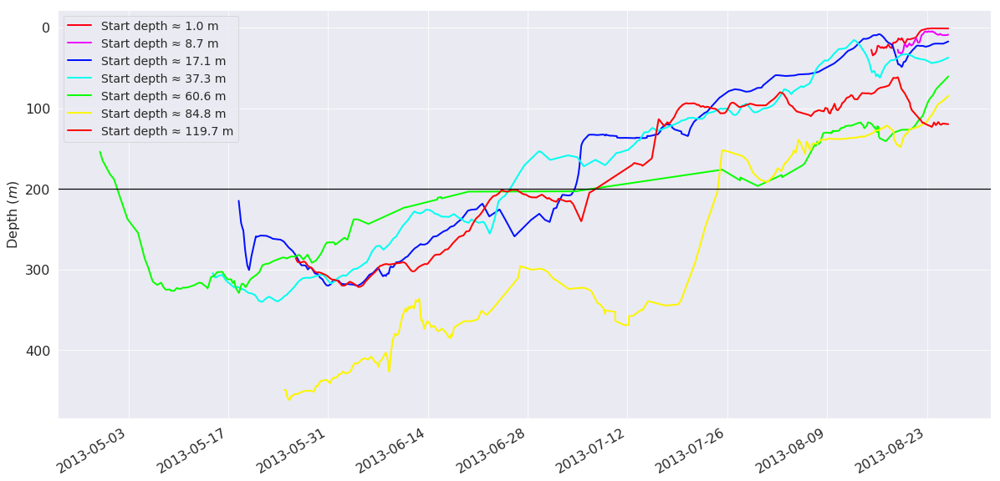

In [138]:
print("At LB08")
fig, ax1 = plt.subplots(1, 1, figsize=(20,10))

for traj_depth_level in np.arange(0,traj_depth.shape[1],2):

    ax1.plot(np.flip(mydates, axis=0) , np.multiply(-1,traj_depth[:mydates_Newport.shape[0],traj_depth_level]) , color = colors[traj_depth_level] ,linewidth=2, \
            label = 'Start depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,traj_depth_level])))


ax1.axhline(y=200, color = 'k')

ax1.tick_params(axis='both',labelsize =16)
ax1.set_ylabel('Depth ($m$)', fontsize = 16)# and Wind stress (*10^3) (N/m^2)', fontsize = 16)
ax1.grid()
ax1.tick_params(axis='both',labelsize =16, color = colors[traj_depth_level])

ax1.set_ylim(ax1.get_ylim()[::-1]) 
ax1.legend(loc='best', fontsize = 14)
fig.autofmt_xdate()



At LB08


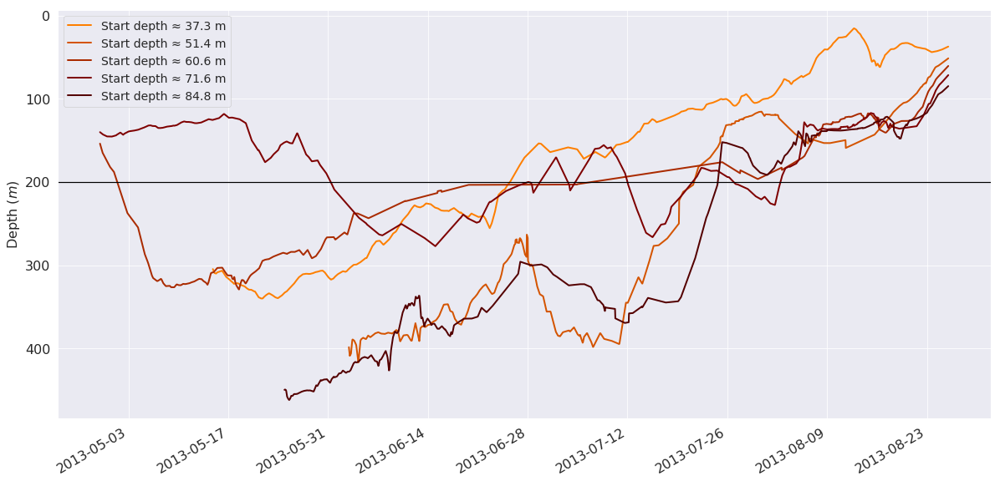

In [139]:
print("At LB08")
fig, ax1 = plt.subplots(1, 1, figsize=(20,10))

for traj_depth_level in np.arange(6,11):

    ax1.plot(np.flip(mydates, axis=0) , np.multiply(-1,traj_depth[:mydates_Newport.shape[0],traj_depth_level]) , color = colors_edge[traj_depth_level] ,linewidth=2, \
            label = 'Start depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,traj_depth_level])))



ax1.axhline(y=200, color = 'k')
ax1.tick_params(axis='both',labelsize =16)
ax1.set_ylabel('Depth ($m$)', fontsize = 16)# and Wind stress (*10^3) (N/m^2)', fontsize = 16)
ax1.grid()
ax1.tick_params(axis='both',labelsize =16, color = colors[traj_depth_level])

ax1.set_ylim(ax1.get_ylim()[::-1]) 
ax1.legend(loc='best', fontsize = 14)
fig.autofmt_xdate()



In [4]:
mesh_mask_large  = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/mesh_mask.nc')

tmask   = mesh_mask_large.variables['tmask'][:,:32,179:350,479:650]

In [11]:
np.max(np.nonzero(tmask[0,:,78,124]))

22

In [31]:
269-180

89

In [32]:
572-480

92

In [34]:
x1[0]

91.010000000000005